# Regression Project

In this project, your goal is to build regression models of housing prices. The models should learn from data and be able to predict the median house price in a district (which is a population of 600 to 3000 people), given some predictor variable

Das Vorgehen in diesem Notebook orientiert sich am Data Science Lifecycle.
Es wird eine Modellpräzision von > 70% gewünscht. Das bedeutet, dass der R-squared Wert des besten Modells >0,7 sein soll.

In [2]:
import plotly
plotly.__version__

'5.1.0'

## Python Setup

Zunächst werden mit der Import Methode wichtige Python Bibliotheken importiert.

In [54]:
import pandas as pd
import numpy as np 

import seaborn as sns
sns.set_theme(style='ticks')

import matplotlib.pyplot as plt
%matplotlib inline

import statsmodels.formula.api as smf
import statsmodels.api as sm
import statsmodels.gam.api as smg
from statsmodels.compat import lzip
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector as selector
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
import sklearn.metrics as skm
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.preprocessing import SplineTransformer
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline

import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

## Datenaufbereitung

### Daten laden
Importieren der Daten aus der CSV in Github und Erstellung eines Pandas Dataframes zur Bearbeitung und Verwendung der Daten in diesem Notebook.

In [3]:
GIT = "https://raw.githubusercontent.com/jan-kirenz/project-annikas428/main/"
DATA = "project_data.csv"
TOKEN = "?token=GHSAT0AAAAAABPURMBOEW2WS3JEBXGI5TPAYPJRBIQ"

df_initial = pd.read_csv(GIT + DATA + TOKEN)

### Inspect Data

Im ersten Schritt ist es wichtig, sich einen Überblick über die Daten zu verschaffen. Begonnen wird mit einer Anzeige einiger Datensätze.

In [4]:
df_initial

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,price_category
0,-122.23,37.88,41.0years,880,129.0,322,126,8.3252,452600.0$,NEAR BAY,above
1,-122.22,37.86,21.0,7099,1106.0,2401,1138,8.3014,358500.0,NEAR BAY,above
2,-122.24,37.85,52.0,1467,190.0,496,177,7.2574,352100.0,NEAR BAY,above
3,-122.25,37.85,52.0,1274,235.0,558,219,5.6431,341300.0,NEAR BAY,above
4,-122.25,37.85,52.0,1627,280.0,565,259,3.8462,342200.0,NEAR BAY,above
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665,374.0,845,330,1.5603,78100.0,INLAND,above
20636,-121.21,39.49,18.0,697,150.0,356,114,2.5568,77100.0,INLAND,above
20637,-121.22,39.43,17.0,2254,485.0,1007,433,1.7000,92300.0,INLAND,above
20638,-121.32,39.43,18.0,1860,409.0,741,349,1.8672,84700.0,INLAND,above


Beim Sichten der Datensätze fällt auf, dass im ersten Datensatz zwei Unstimmigkeiten im Vergleich zu den anderen Datensätzen vorliegen: <br>
_median_house_value_ ist nur hier mit der Währung Dollar angegeben und hinter _housing_median_age_ steht der Zusatz "years". 

Nun folgt Pandas Dataframe Info Methode. Diese zeigt die Variablen und deren Datentypen, sowie die Anzahl der non-null values je Spalte an. 

In [5]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  object 
 3   total_rooms         20640 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  int64  
 6   households          20640 non-null  int64  
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  object 
 9   ocean_proximity     20640 non-null  object 
 10  price_category      20640 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 1.7+ MB


Die Variablen _housing_median_age_ und und _median_house_value_ wurden als Datentyp _object_ definiert. Dies muss genauer untersucht werden, da bei einer Jahreszahl bzw. einem monetären Wert ein numerischer Datentyp (int oder float) angemessener ist. Die Ursache hierfür ist auf die Zusatzangaben "$" und "years" zurückzuführen. <br>
Die Varialben _ocean_proximity_ und _price_category_ sind keine numerischen sondern kategoriale Datentypen. Diese lassen sich jeweils in einer internen Rangordnung anordnen. Sie sind daher ordinal. Der richtige Datentyp hierfür ist _category_. Die Transformation der Datentypen erfolgt in Kapitel "Data Transformation". <br>
Neben den Datentypen wird auch die Anzahl der non-null values je Variable angezeigt. Hier haben alle Variablen eine Anzahl von 20640 non-null values. Lediglich die Variable _total_bedrooms_ liegt unter diesem Wert. Dies lässt darauf schließen, dass hier einige Datensätze keinen Wert haben. Dies gilt es im Folgenden genauer zu untersuchen.

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
price_category          0
dtype: int64


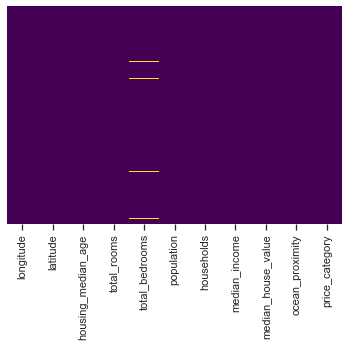

In [6]:
# show missing values -if present - in yellow
sns.heatmap(df_initial.isnull(), 
            yticklabels=False,
            cbar=False, 
            cmap='viridis');

print(df_initial.isnull().sum())

Wie bereits vermutet, enthält die Variable _total_bedrooms_ 207 null values. Die Abbildung visualisiert diese nicht befüllten Datensätze und deren Verteilung im Datenset in gelb. Die null-values sind zufällig im Datenset verteilt. Da das Datenset über 20000 Datensätze enthält, werden die Zeilen mit den null-values im Kapitel Transform Data entfernt. Alternativ wäre auch eine Belegung der null-values beispielsweise mit dem Durchschnittswert der Variable möglich. Darauf wird hier jedoch verzichtet, genug andere Datensätze vorliegen.

### Datentransformation
#### Entfernung der null values

In [7]:
# drop rows with missing values
df = df_initial.dropna()
print(df.isnull().sum())

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
price_category        0
dtype: int64


#### Entfernung unwichtiger Features
Das Feature _price_category_ wird entfernt, da es sich direkt aus der Variablen _median_house_value_ ableitet und daher nicht zur Berechnung des Wertes genutzt werden darf. Dieses Feature wird im Notebook Classification als abhängige Variable genutzt.

In [8]:
#drop irrelevant features
df = df.drop(['price_category'], axis=1)

#### Konvertierung von Datentypen
Die mithilfe der info() Methode identifizierten Features, welche eine Datentyp Konvertierung benötigen, werden nun bearbeitet.

In [9]:
# Convert data types Ocean_Proximity and Price_Category to Data Type "Category" as they are categorical variables (ordinal)
df.ocean_proximity = df.ocean_proximity.astype('category')

# Housing_Median_Age and Median_House_Value are actually int64 values, but pandas did not get this because of signs like '€'
df.housing_median_age = df.housing_median_age.str.replace('years', '', regex=False)
df.median_house_value = df.median_house_value.str.replace('$', '', regex=False)
df.housing_median_age = pd.to_numeric(df.housing_median_age, errors='coerce').astype('int64')
df.median_house_value = pd.to_numeric(df.median_house_value, errors='coerce').astype('float64')
df.total_bedrooms = df.total_bedrooms.astype('int64')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20433 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20433 non-null  float64 
 1   latitude            20433 non-null  float64 
 2   housing_median_age  20433 non-null  int64   
 3   total_rooms         20433 non-null  int64   
 4   total_bedrooms      20433 non-null  int64   
 5   population          20433 non-null  int64   
 6   households          20433 non-null  int64   
 7   median_income       20433 non-null  float64 
 8   median_house_value  20433 non-null  float64 
 9   ocean_proximity     20433 non-null  category
dtypes: category(1), float64(4), int64(5)
memory usage: 1.6 MB


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41,880,129,322,126,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21,7099,1106,2401,1138,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52,1467,190,496,177,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52,1274,235,558,219,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52,1627,280,565,259,3.8462,342200.0,NEAR BAY


Mithilfe der string replace Methode werden die zuvor identifizierten Zeichen "years" und "$" entfernt. Anschließend ist eine Transformation der Features in integer bzw. float Werte möglich. Für _housing_median_age_ wird integer gewählt, da die Jahreszahlen als Ganze Zahlen also discrete Werte angegeben sind. <br>
Für _median_house_value_ wird der Datentyp float benötigt, da die Ergebnisse einer linearen Regression stehts continous sind.

#### Hinzufügen neuer Features

In [10]:
df = df.assign(people_per_household=lambda df: df.population / df.households)
df = df.assign(rooms_per_household=lambda df: df.total_rooms / df.households)
df = df.assign(bedrooms_per_people=lambda df: df.total_bedrooms / df.population)
df = df.assign(bedrooms_per_rooms=lambda df: df.total_bedrooms / df.total_rooms)

Diese Features werden dem Datenset hinzugefügt, in der Hoffnung, dass diese für die Verwendung in den Modellen nützlich sein könnten. Untersucht wird dies im Kapitel EDA.

## Datensplit
Split des Datensets in 80% Trainingsdaten und 20% Testdaten. Die Testdaten werden anschließend bis zur finalen Evaluation der besten Modelle nicht verwendet.

In [11]:
train_dataset = df.sample(frac=0.8, random_state=0) 
test_dataset = df.drop(train_dataset.index)

train_dataset

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
14185,-117.08,32.70,37,2176,418,1301,375,2.8750,98900.0,NEAR OCEAN,3.469333,5.802667,0.321291,0.192096
6125,-117.91,34.11,20,3158,684,2396,713,3.5250,153000.0,<1H OCEAN,3.360449,4.429173,0.285476,0.216593
14095,-117.10,32.75,11,2393,726,1905,711,1.3448,91300.0,NEAR OCEAN,2.679325,3.365682,0.381102,0.303385
14359,-117.22,32.74,52,1260,202,555,209,7.2758,345200.0,NEAR OCEAN,2.655502,6.028708,0.363964,0.160317
18004,-121.99,37.29,32,2930,481,1336,481,6.4631,344100.0,<1H OCEAN,2.777547,6.091476,0.360030,0.164164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6168,-117.93,34.09,35,1891,353,1093,382,4.0167,165500.0,<1H OCEAN,2.861257,4.950262,0.322964,0.186674
4174,-118.21,34.10,36,2000,533,1234,535,3.7437,241700.0,<1H OCEAN,2.306542,3.738318,0.431929,0.266500
3593,-118.48,34.24,32,2621,412,1285,414,6.6537,267600.0,<1H OCEAN,3.103865,6.330918,0.320623,0.157192
5366,-118.39,34.04,44,1873,286,635,283,5.5951,461300.0,<1H OCEAN,2.243816,6.618375,0.450394,0.152696


## Deskriptive Statistik

### Kennzahlenanalyse numerischer Variablen

Mithilfe der describe() Methode werden die wichtigsten Kennzahlen numerischer Variablen (bspw. Durchschnitt, min und max Werte) ausgegeben.

In [12]:
#summary statistics for all numerical columns
train_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,16346.0,-119.564154,2.002618,-124.350000,-121.790000,-118.490000,-118.000000,-114.470000
latitude,16346.0,35.630318,2.138574,32.550000,33.930000,34.250000,37.710000,41.950000
housing_median_age,16346.0,28.664505,12.556764,1.000000,18.000000,29.000000,37.000000,52.000000
total_rooms,16346.0,2622.235776,2169.548287,11.000000,1448.000000,2119.000000,3120.750000,39320.000000
total_bedrooms,16346.0,535.281659,418.469078,3.000000,296.000000,432.500000,644.000000,6445.000000
population,16346.0,1416.087055,1103.842065,3.000000,784.250000,1164.000000,1711.000000,28566.000000
households,16346.0,496.758167,379.109535,3.000000,280.000000,408.000000,600.000000,6082.000000
median_income,16346.0,3.869337,1.902228,0.499900,2.555675,3.533200,4.744225,15.000100
median_house_value,16346.0,206916.154411,115676.394484,14999.000000,119300.000000,179700.000000,265900.000000,500001.000000
people_per_household,16346.0,3.089529,11.525259,0.692308,2.428850,2.816514,3.282584,1243.333333


Der Durchschnitt (mean) der Variablen _housing_median_age_ über alle Datensätze beträgt 28,64 Jahre. Die Standardabweichung, also die durchschnittliche Abweichung der Werte vom Durchschnitt, beträgt 12,56 Jahre. Das Minimum liegt bei 1 Jahr, das Maximum bei 52 Jahren. 25% der Datensätze liegen unter 18 Jahren (1. Quartil). 50% unter 29 Jahren (2. Quartil) und 75% unter 37 Jahren (3. Quartil).<br>
Im Durchschnitt beträgt der Wert _people_per_household_ 3,09. Die durchschnittliche Abweichung von diesem Wert beträgt 11,53. Das Minimum liegt bei 0,69 und das Maximum bei 1243 Personen pro Haushalt. 25% der Datensätze liegen zwischen 0,69 und 2,43. 50% unter 2,82 und 75% der Datensätze unter 3,28 Personen pro Haushalt.

In [13]:
print(train_dataset.quantile(0.99, interpolation='nearest'))

longitude                 -116.290000
latitude                    40.630000
housing_median_age          52.000000
total_rooms              11021.000000
total_bedrooms            2208.000000
population                5723.000000
households                1955.000000
median_income               10.557500
median_house_value      500001.000000
people_per_household         5.286920
rooms_per_household         10.500000
bedrooms_per_people          0.941606
bedrooms_per_rooms           0.407472
Name: 0.99, dtype: float64


Die Quantile() Methode gibt für jede Variable einen Wert an, unter welchem (in diesem Beispiel) 99% der Datensätze liegen. <br>
Beispielsweise liegen 99% der Datensätze unter einer Anzahl _total_rooms_ in Höhe von 11021. <br>
99% der Distrikte haben eine _population_ unter 5723 Einwohnern. <br>
Im Nachfolgenden werden einige mögliche Ausreißer identifiziert.

In [14]:
train_dataset.loc[train_dataset.people_per_household > 70]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
9172,-118.59,34.47,5,538,98,8733,105,4.2391,154600.0,INLAND,83.171429,5.123810,0.011222,0.182156
19006,-121.98,38.32,45,19,5,7460,6,10.2264,137500.0,INLAND,1243.333333,3.166667,0.000670,0.263158
16669,-120.70,35.32,46,118,17,6532,13,4.2639,350000.0,NEAR OCEAN,502.461538,9.076923,0.002603,0.144068
3364,-120.51,40.41,36,36,8,4198,7,5.5179,67500.0,INLAND,599.714286,5.142857,0.001906,0.222222


Mehr als 70 Leute in einem Haushalten wirken sehr unrealistisch. 99% der Datensätze liegen unter einem Wert von 5,29 Personen pro Haushalt. Daher werden diese Datensätze als Ausreißer identifiziert.

In [15]:
train_dataset.loc[train_dataset.bedrooms_per_people > 8]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
11862,-121.25,40.27,25,958,245,28,16,2.625,67500.0,INLAND,1.75,59.875,8.75,0.255741


Auch dieser Wert liegt weit über dem 99% Perzentil der Varialben _bedrooms_per_people_ und wird daher als Ausreiser entfernt.

In [181]:
train_dataset.loc[train_dataset.rooms_per_household > 55]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
12447,-114.49,33.97,17,2809,635,83,45,1.6154,87500.0,INLAND,1.844444,62.422222,7.650602,0.226059
11862,-121.25,40.27,25,958,245,28,16,2.6250,67500.0,INLAND,1.750000,59.875000,8.750000,0.255741
1913,-120.06,39.01,19,2967,528,112,48,4.0714,437500.0,INLAND,2.333333,61.812500,4.714286,0.177958


Auch diese Datensätze liegen weit über dem Wert des 99% Perzentils und werden daher aus dem Datenset entfernt.

In [28]:
#drop people per household outliers
train_dataset = train_dataset.drop([3364, 9172, 16669, 19006])
#drop bedroooms per people outliers
train_dataset = train_dataset.drop([11862])
#drop rooms per household_outliers
train_dataset = train_dataset.drop([1913, 12447])

KeyError: '[ 3364  9172 16669 19006] not found in axis'

In [17]:
#summary statistics for all numerical columns
train_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,16339.0,-119.564115,2.002470,-124.350000,-121.790000,-118.490000,-118.000000,-114.470000
latitude,16339.0,35.629562,2.138070,32.550000,33.930000,34.250000,37.710000,41.950000
housing_median_age,16339.0,28.664973,12.555983,1.000000,18.000000,29.000000,37.000000,52.000000
total_rooms,16339.0,2622.903544,2169.632035,11.000000,1449.000000,2120.000000,3121.500000,39320.000000
total_bedrooms,16339.0,535.416978,418.477283,3.000000,296.000000,433.000000,644.000000,6445.000000
population,16339.0,1415.032315,1100.485866,3.000000,785.000000,1164.000000,1711.000000,28566.000000
households,16339.0,496.956301,379.069221,3.000000,280.000000,408.000000,600.500000,6082.000000
median_income,16339.0,3.869002,1.901829,0.499900,2.555600,3.532900,4.744150,15.000100
median_house_value,16339.0,206925.109248,115665.635455,14999.000000,119300.000000,179700.000000,265900.000000,500001.000000
people_per_household,16339.0,2.941847,1.128881,0.692308,2.428863,2.816514,3.282400,63.750000


### Analyse kategorialer Variablen

In [18]:
# summary statistics for all categorical columns
train_dataset.describe(include=['category']).transpose()

,count,unique,top,freq
ocean_proximity,16339,5,<1H OCEAN,7216


Die Variable ocean_proximity besitzt 5 Ausprägungen, wovon die Ausprägung _<1H OCEAN_ mit einer Anzhl von 7216 am häufigsten vorkommt.

In [19]:
train_dataset['ocean_proximity'].value_counts()

<1H OCEAN     7216
INLAND        5215
NEAR OCEAN    2107
NEAR BAY      1796
ISLAND           5
Name: ocean_proximity, dtype: int64

Hier wird die Häufigkeit einzelner Ausprägungen von _ocean_proximity_ dargestellt. Die Ausprägung _ISLAND_ kommt über das gesamte Datenset mit über 20000 Datensätzen nur fünfmal vor. In Relation zur Gesamtanzahl der Datensätzen ist dies sehr wenig, wodurch die Aussagekraft dieser Ausprägung vermutlich eher gering ist. Daher werden die Datensätze mit Ausprägung _ISLAND_ mit der Ausprägung _NEAR OCEAN_ vereint.


In [20]:
train_dataset.loc[train_dataset.ocean_proximity == 'ISLAND']

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
8318,-118.48,33.43,29,716,214,422,173,2.6042,287500.0,ISLAND,2.439306,4.138728,0.507109,0.298883
8316,-118.32,33.33,52,2127,512,733,288,3.3906,300000.0,ISLAND,2.545139,7.385417,0.698499,0.240715
8315,-118.33,33.34,52,2359,591,1100,431,2.8333,414700.0,ISLAND,2.552204,5.473318,0.537273,0.250530
8314,-118.32,33.35,27,1675,521,744,331,2.1579,450000.0,ISLAND,2.247734,5.060423,0.700269,0.311045
8317,-118.32,33.34,52,996,264,341,160,2.7361,450000.0,ISLAND,2.131250,6.225000,0.774194,0.265060


In [21]:
# write out a dict with the mapping of old to new
remap_cat_dict = {
    'NEAR OCEAN': 'NEAR OCEAN',
    'NEAR BAY': 'NEAR BAY',
    'ISLAND': 'NEAR OCEAN',
    'INLAND': 'INLAND',
    '<1H OCEAN': '<1H OCEAN' }

train_dataset.ocean_proximity = train_dataset.ocean_proximity.map(remap_cat_dict).astype('category')

## Exploratory Data Anaysis

Dieses Kapitel dient der ausführlichen Datenanalyse der Testdaten. Hierfür werden vor allem geeignete Visualisierungen in Form von Diagrammen verwendet.

### erster Überblick

In [22]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scattergeo(
        lon = train_dataset['longitude'],
        lat = train_dataset['latitude'],
        text = 'median house value in district: ' + train_dataset['median_house_value'].astype(str) + '$',
        marker_color = train_dataset['median_house_value'], marker_size=2, marker_colorscale = 'Inferno', marker_colorbar= {'title': 'Median House Value'}
        ))

fig.update_layout(
        title = 'Median House Value per District in California',
        geo_scope='usa',
    )
    
pyo.iplot(fig)

Die Datensätze stammen alle aus Kalifornien, USA. <br>
Die Werte Longitude und Latitude unterscheiden sich daher kaum, wie sich auch bereits im Kapitel deskriptive Statistik gezeigt hat.
Daher sind sie als Feature eher ungeeignet. <br> 
Allerdings scheint die Entfernung zum Ozean eine wichtige Rolle im Bezug auf den _median_house_value_ zu spielen.
_ocean_proximity_ scheint daher als Feature interessant und sollte genauer untersucht werden.

In [23]:
train_dataset = train_dataset.drop(['longitude', 'latitude'], axis = 1)

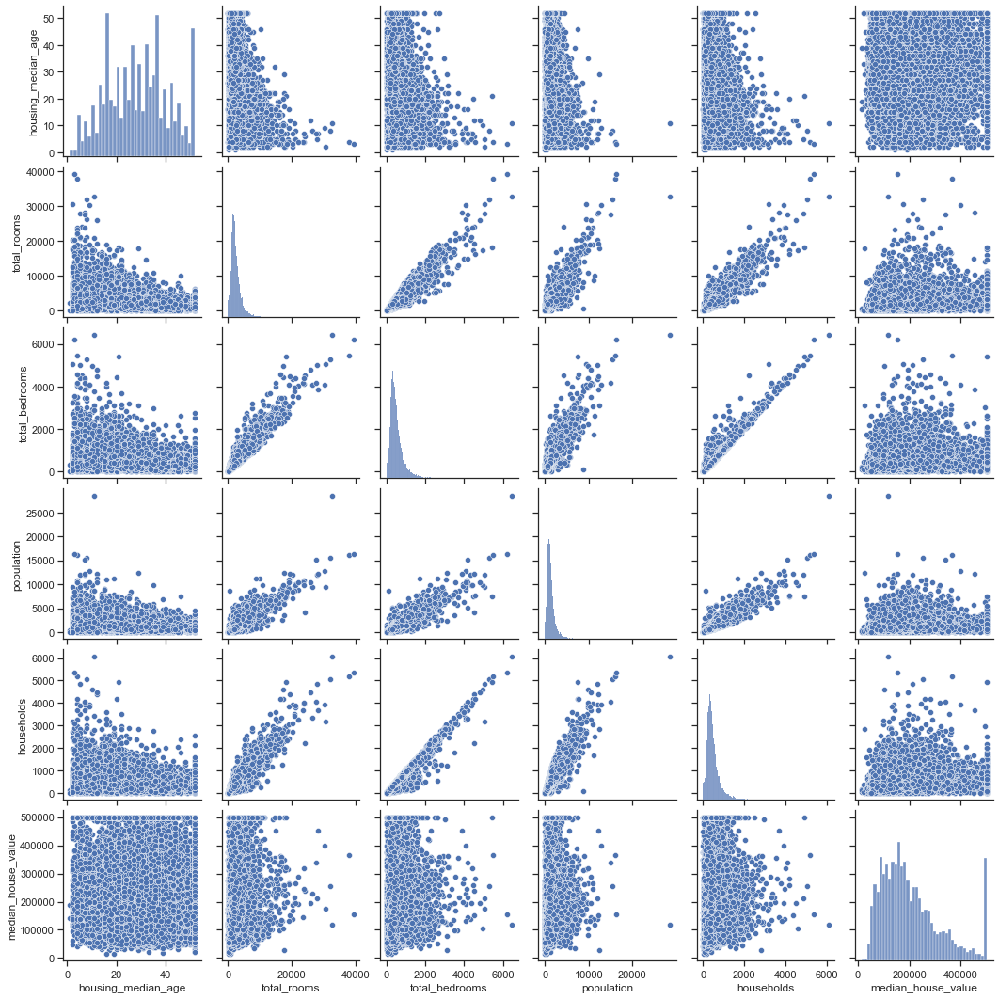

In [16]:
sns.pairplot(train_dataset[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_house_value']])

Die hier abgebildeten, unabhängigen Variablen weisen eine starke Korrelation untereinander auf (bis auf housing_median_age). <br>
In Bezug auf die abhängige Variable _median_house_value_ zeigen die Plots zunächst keinen starken Zusammenhang. <br>
Interessant sieht das Histogramme von _median_house_value_ aus, da es am äußeren rechten Rand nochmal hohe Häufigkeiten haben. Dieses Histogramme wird später nochmal genauer analysisiert.

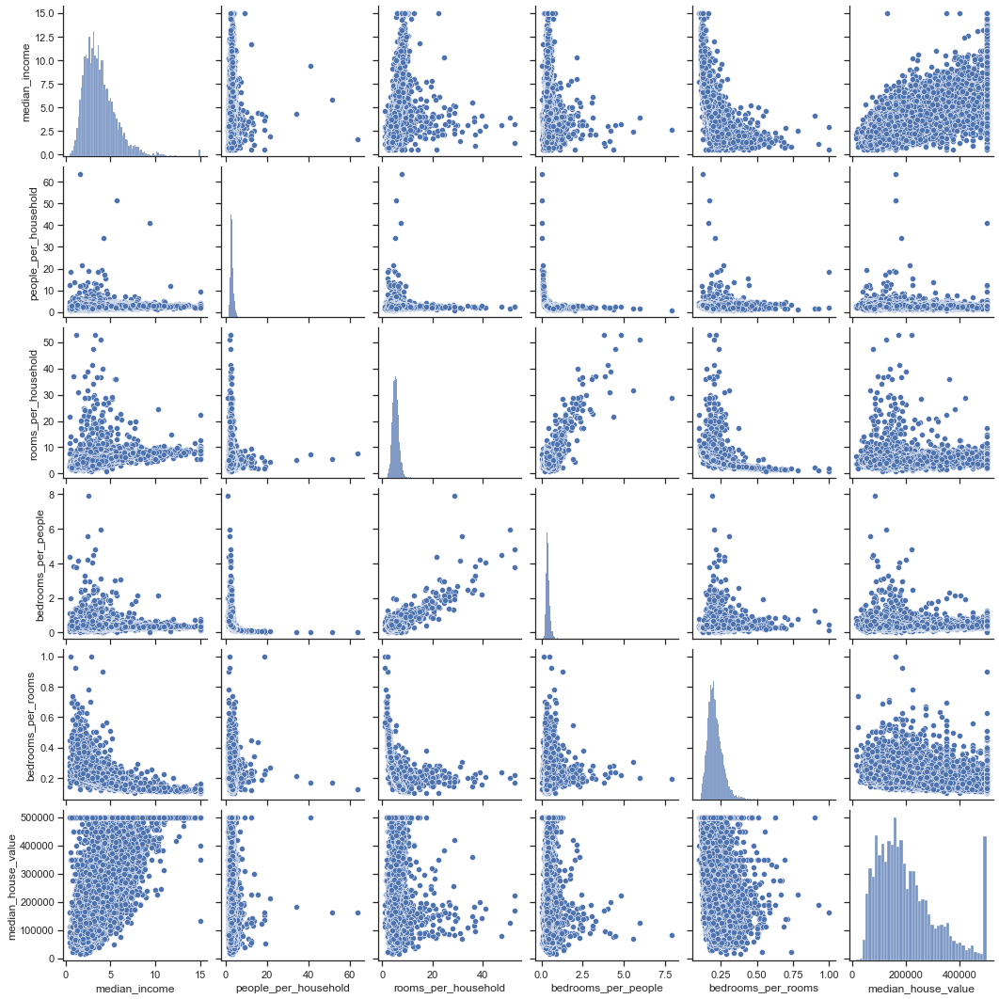

In [22]:
sns.pairplot(train_dataset[['median_income', 'people_per_household', 'rooms_per_household', 'bedrooms_per_people', 'bedrooms_per_rooms', 'median_house_value']]);

Zwischen _median_income_ und _median_house_value_ ist ein linearer Zusammenhang erkennbar. Auch das Histogramm von _median_income_ zeigt eine hohe Säule am rechten Rand. <br>
Auch für die selbst definierten Variablen ist es schwierig, ein linearen Zusammenhang zu _median_house_value_ zu erkennen.

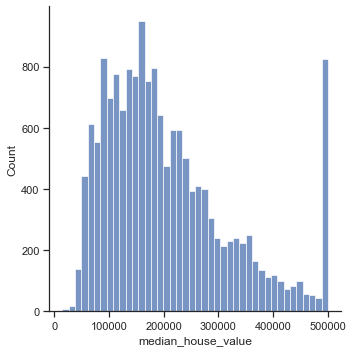

In [18]:
fig = sns.displot(data= train_dataset, x='median_house_value')

Die Verteilung von Median_House_value ist nicht normalverteilt, rechts im hohen Preissegment ist die Häufigkeit nochmal extrem hoch. Über 500000 Dollar exisiteren keine weiteren Hauswerte. Möglicherweise wurde der Datensatz mit Werten über 500000 Dollar abgeschnitten und für alle höheren Werte, der Wert 500000 gesetzt.

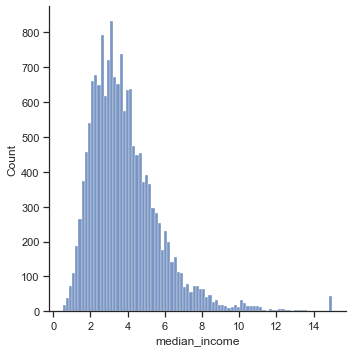

In [19]:
fig = sns.displot(data= train_dataset, x='median_income')

Womöglich wurde auch die Variable _median_income_ nach oben abgeschnitten.

### Korrelationsanalyse

In [24]:
# Create correlation matrix for numerical variables
corr_matrix = train_dataset.corr()
corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value      1.000000
median_income           0.692099
rooms_per_household     0.176503
total_rooms             0.130828
housing_median_age      0.105534
bedrooms_per_people     0.077487
households              0.063096
total_bedrooms          0.047606
population             -0.026634
people_per_household   -0.178408
bedrooms_per_rooms     -0.253025
Name: median_house_value, dtype: float64

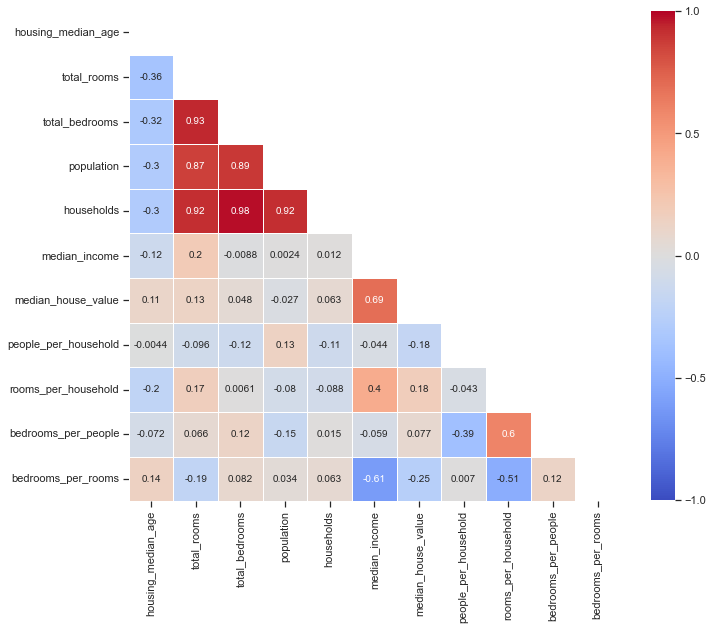

In [25]:
# Make a pretty heatmap

# Use a mask to plot only part of a matrix
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)]= True

# Change size
plt.subplots(figsize=(11, 15))

# Build heatmap with additional options
heatmap = sns.heatmap(corr_matrix, 
                      mask = mask, 
                      square = True, 
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .6,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {"size": 10})

Laut der Korrelationsmatrix einigen sich vor allem folgende Variablen: <br>
_median_income_ weist mit einem Wert von 0,69 die höchste Korrelation auf, danach folgen _bedrooms_per_rooms_ mit einer negativen Korrelation in Höhe von -0,25 und anschließend _people_per_household_ ebenfalls mit einer negativen Korrelation in Höhe von -0,18. <br>
Danach folgt _rooms_per_household_, allerdings kann diese Variable nicht in Kombination mit den beiden zuvor genannten genutzt werden, da sie sich aus _total_rooms_ und _households_ zusammensetzt. Diese Werte werden jedoch bereits in _bedrooms_per_rooms_ und _people_per_household_ verwendet, daher ist die zusätzliche Verwendung von _rooms_per_household_ nicht sinnvoll. <br>
_housing_median_age_ könnte mit einer Korrelation von 0,11 noch einen positiven Einfluss auf das Modell haben.

### Analyse der kategorialen Variable Ocean_Proximity

<AxesSubplot:xlabel='ocean_proximity', ylabel='median_house_value'>

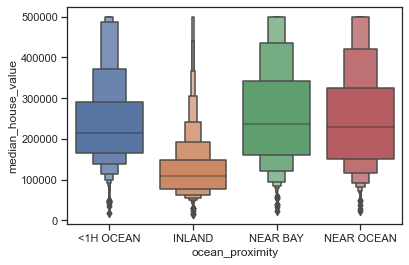

In [25]:
sns.boxenplot(data=train_dataset, x='ocean_proximity', y='median_house_value')

<AxesSubplot:xlabel='ocean_proximity', ylabel='median_house_value'>

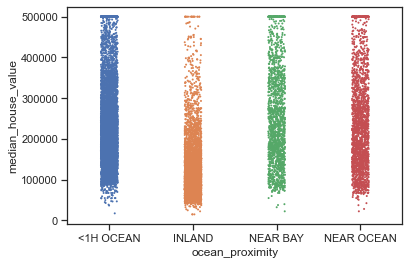

In [63]:
sns.stripplot(data=train_dataset, x='ocean_proximity', y='median_house_value', size=2)

Die Ausprägungen _NEAR BAY_ und _NEAR OCEAN_ unterscheiden sich hinsichtlich _median_house_value_ kaum. Daher können diese beiden Ausprägungen zusammengefasst werden.

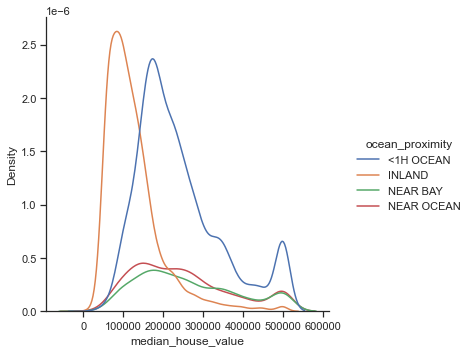

In [64]:
sns.displot(data=train_dataset, x='median_house_value', hue='ocean_proximity', kind='kde')

Auch in der Häufigkeitsverteilung zeigen _NEAR BAY_ und _NEAR OCEAN_ kaum Unterschiede. 

In [26]:
# write out a dict with the mapping of old to new
remap_cat_dict = {
    'NEAR OCEAN': 'NEAR COAST',
    'NEAR BAY': 'NEAR COAST',
    'INLAND': 'INLAND',
    '<1H OCEAN': '<1H OCEAN' }

train_dataset.ocean_proximity = train_dataset.ocean_proximity.map(remap_cat_dict).astype('category')

<AxesSubplot:xlabel='ocean_proximity', ylabel='median_house_value'>

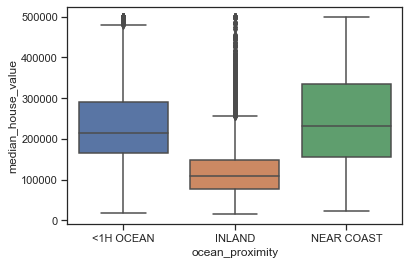

In [305]:
sns.boxplot(data=train_dataset, x='ocean_proximity', y='median_house_value')

Auch _NEAR COAST_ und _<1H OCEAN_ zeigen eine ähnliche Verteilung des Medians und der Quartile. Das 3. Quartil von _NEAR COAST_ zieht sich jedoch noch um ca. 50000$ weiter nach oben, als das von _<1H OCEAN_, daher bleibt die Differenzierung dieser beiden Ausprägungen noch bestehen. <br>
Bei der Ausprägung INLAND sind viele Ausreiser nach oben zu erkennen.

### Analyse numerischer Variablen

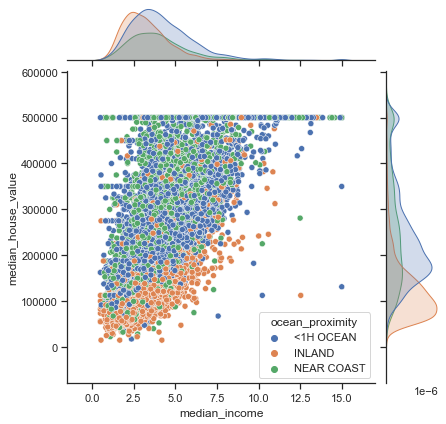

In [68]:
# check relationship with a joint plot
sns.jointplot(x="median_income", y="median_house_value", hue="ocean_proximity", data=train_dataset);

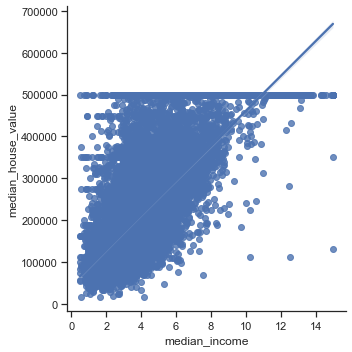

In [13]:
# check relationship with a joint plot
sns.lmplot(x="median_income", y="median_house_value", data=train_dataset);

Wie bereits aus der Korrelationsmatrix zu schließen, ist ein linearer Zusammenhang zwischen _median_income_ und _median_house_value_ erkennbar. Die "Linie" mit Datenpunkten bei 500000 Dollar ergibt sich aus der anzunehmenden Begrenzung der median_house_value_ auf 500000 Dollar. <br>
Auch innerhalb der einzelenden Ausprägungen von _ocean_proximity_ ist eine lineare Korrelation von _median_income_ und _median_house_value_ erkennbar.

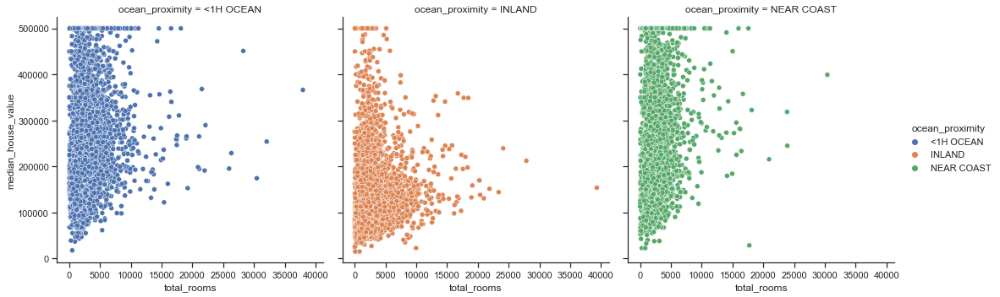

In [18]:
sns.relplot(data=train_dataset, x='total_rooms', y='median_house_value', hue='ocean_proximity', col='ocean_proximity')

Ein linearer Zusammenhang von _total_rooms_ zu _median_house_value_ ist nicht wirklich zu erkennen. Die Variable ist daher für eine lineare Regression eher ungeeignet.

In [27]:
# Plot with Plotly Express
fig = px.scatter(x=train_dataset['bedrooms_per_rooms'], y=train_dataset['median_house_value'], opacity=0.65, 
                trendline='ols', trendline_color_override='darkred')
pyo.iplot(fig)

In [29]:
fig = px.scatter(x=train_dataset['people_per_household'], y=train_dataset['median_house_value'], opacity=0.65, 
                trendline='ols', trendline_color_override='darkred')
pyo.iplot(fig)

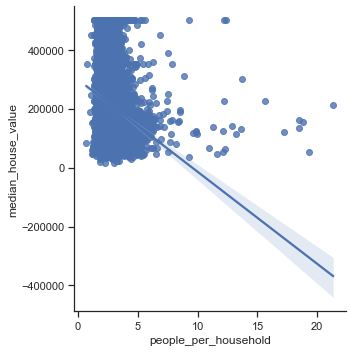

In [224]:
sns.lmplot(data=train_dataset, x='people_per_household', y='median_house_value')

_bedrooms_per_rooms_ und _people_per_household_ zeigen einen negativen linearen Zusammenhang. Bereits in der Korrelationsmatrix war der negative Zusammenhang dieser beiden Variablen zu _median_house_value_ sichtbar. Die Variablen werden nachfolgend in die linearen Regressionsmodelle aufgenommen.

## Modellierung

### Statsmodel

#### Model 1 - OLS Regression

Als erstes Modell wird statsmodels OLS Regression verwendet. <br>
Die sogenannten Filter Methode ist eine von drei Möglichkeiten bei der Feature Selektion. Gemäß dieser werden beispielsweise auf Basis einer Korrelationsmatrix die besten Feature ausgewählt und diese dem Modell zur Verfügung gestelltn. <br>
Folgende Features wurden als geeignet identifiziert: _median_income_, _ocean_proximity_, _bedrooms_per_rooms_, _people_per_household_ und eventuell _housing_median_age_. <br>
Im ersten Modell werden die vier zuerst genannten Features verwendet.

In [30]:
# Fit Model
lm = smf.ols(formula='median_house_value ~ median_income + ocean_proximity + bedrooms_per_rooms + people_per_household' , data=train_dataset).fit()
# Full summary
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.623
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     5407.
Date:                Wed, 19 Jan 2022   Prob (F-statistic):               0.00
Time:                        12:34:59   Log-Likelihood:            -2.0569e+05
No. Observations:               16339   AIC:                         4.114e+05
Df Residuals:                   16333   BIC:                         4.114e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                      3.394e+04   4569.346      7.428      0.000     2.5e+04    4.29e+04
ocean_proximity[T.INLAND]     -6.785e+04   1408.255    -48.179      0.000   -7.06e+04   -6.51e+04
ocean_proximity[T.NEAR COAST]  1.557e+04   1423.620     10.934      0.000    1.28e+04    1.84e+04
median_income                  4.323e+04    404.027    107.007      0.000    4.24e+04     4.4e+04
bedrooms_per_rooms             3.009e+05    1.3e+04     23.197      0.000    2.75e+05    3.26e+05
people_per_household          -1.376e+04    496.667    -27.713      0.000   -1.47e+04   -1.28e+04
==============================================================================
Omnibus:                     5010.041   Durbin-Watson:                   1.972
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            27166.062
Skew:                           1.373   Prob(JB):                         0.00
Kurtosis:                       8.689   Cond. No.                         128.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [31]:
lm.params

Intercept                         33939.853081
ocean_proximity[T.INLAND]        -67848.787400
ocean_proximity[T.NEAR COAST]     15566.550456
median_income                     43233.585628
bedrooms_per_rooms               300850.020547
people_per_household             -13763.891665
dtype: float64

Die summary() Methode berechnet die wichtigsten Kennzahlen des Modells. <br>
R-squared ist eine Kennzahl zur Beurteilung der Anpassungsgüte eines Modells und nimmt einen Wert zwischen 0% und 100% an. Als Bezugsbasis wird der Durchschnitt verwendet. <br>
lm erreicht einen R-squared Wert in Höhe von 62,3%. Somit können 62,3% der _median_house_value_ Streuung <br>
In statistischen Methoden wird meist lieber der adjusted R-squared genutzt. Da dieser die degrees of freedom miteinbezieht, lässt sich durch adj. R-squared einen besseren Rückschluss auf die Gesamtpopulation der Datensätze ziehen. Dieser ist meistens etwas schlechter als R-squared. In diesem Modell sind beide Werte gleich hoch. <br>
Mithilfe der Kennzahlen AIC und BIC soll ein overfitting des Modells verhindert werden. Für jedes zusätzliche Feature wird eine "Bestrafung" in die Kennzahlen miteinberechnet. Je kleiner die Werte, desto besser. In diesem Modell sind die Werte jedoch relativ hoch.<br>
F-statistics ist die Menge der systematischen Varianz (MSM) geteilt durch die Menge der unsystematischen Varianz (MSR). Die Kennzahl gibt an, in welcher Höhe das Modell die Ergebnisausgabe der abhängigen Variable verbessert hat, verglichen zu Ungenauigkeit im Modell. Je höher F-statistics, desto besser. Ein F-statistics Wert in Höhe von 5407, wie in Modell lm, ist schon sehr gut. <br>
Der Y-Achsenschnittpunkt des Modells liegt bei 33939,85. Die Steigung der einzelnen Features ist in der Spalte _coef_ abzulesen. Zu interpretieren sind diese folgendermaßen: Vergrößert sich der Wert in Variable _median_income_ um 1 und alle anderen Werte bleiben konstant, so ist das Ergebnis um 43233,59 größer als zuvor. <br>
Die p-values der Features liegen alle bei 0,00. Die Nullhypothese (ß=0 => Feature hat keinen Einfluss auf die abhängige Variable) kann demnach für alle Features verworfen werden. <br>
Die p-values für Jarque-Bera und Omnibus liegen ebenfalls bei 0,00. Die Nullhypothese, die Fehler seien normalverteilt, wird in diesem Falle verworfen. Es wird also angenommen, die Residuals seien nicht normalverteilt. Bei einer Datensetgröße > 50, kann dies aufgrund des Central Limit Theorems jedoch vernachlässigt werden. <br>
Der Durbin-Watson Wert liegt bei 1,97. Somit kann angenommen werden, dass die Fehler des Modells keine Korrelation aufweisen.


##### Regression Diagnostics

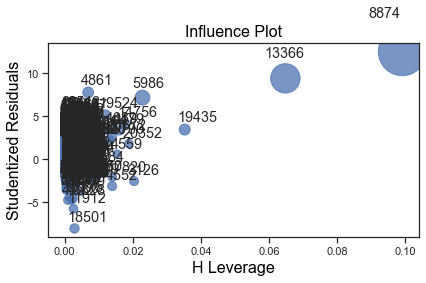

In [16]:
fig = sm.graphics.influence_plot(lm, criterion="cooks")
fig.tight_layout(pad=1.0)

Mithilfe des Influence Plots werden mögliche Ausreiser als blaue Punkte in der Größe entsprechend ihres Einflusses identifiziert. Dies können Werte mit hoher Abweichung in ihrem Y-Wert (outliers) oder X-Wert (high leverage) sein. In einer linearen Regression können solche Ausreise einen großen Einfluss auf das Gesamtmodell haben und somit die Performance des gesamten Modells erheblich verschlechtern. Als Faustregel werden Datenpunkte mit einer _Cooks Distance_ in Höhe von 4/n (wobei n die Anzahl der Datensätze ist) als mögliche Ausreiser identifiziert. 

In [32]:
# obtain Cook's distance 
lm_cooksd = lm.get_influence().cooks_distance[0]

# get length of df to obtain n
n = len(train_dataset["median_income"])
print('n = ', n)

# calculate critical d
critical_d = 4/n
print('Critical Cooks distance:', critical_d)

# identification of potential outliers with leverage
out_d = lm_cooksd > critical_d

# output potential outliers with leverage
print(train_dataset.index[out_d], "\n", 
    lm_cooksd[out_d])

n =  16339
Critical Cooks distance: 0.0002448130240528796
Int64Index([15778,  6776, 11511,  7263, 15723, 14756, 15687,  4638, 14806,
            15815,
            ...
            15809,  8866,   199, 18498,    59, 10749,  8857, 13154,  5470,
            16642],
           dtype='int64', length=934) 
 [1.49490398e-03 2.68414884e-04 4.78133170e-04 5.02665948e-04
 5.94624792e-04 1.45661981e-02 6.06459084e-04 9.89584645e-04
 7.26161610e-04 8.30878122e-04 1.36260242e-03 9.64095843e-04
 4.86783348e-04 3.28695576e-04 3.75058682e-04 7.93946113e-04
 5.82170067e-04 2.59400713e-04 5.38430141e-04 4.34597064e-04
 2.58773707e-04 4.39852205e-04 3.24124357e-04 3.81088866e-04
 2.95276469e-04 8.44927027e-04 4.83475406e-02 5.21391591e-04
 4.36852748e-04 4.06798688e-04 3.74228212e-04 2.75462275e-04
 8.37885379e-04 4.91036338e-04 1.65550557e-03 2.28062263e-03
 1.11362268e-03 5.40836931e-04 5.06680630e-04 2.80028526e-03
 3.84825684e-04 4.88676566e-04 8.68935319e-04 2.51788726e-03
 6.76056994e-04 3.19987726

In diesem Modell werden 934 Datensätze mit einer Cooks Distance > 4/n als mögliche Ausreiser identifiziert. Beispielsweise könnte versucht werden, den Einfluss dieser Datensätze auf das Modell durch Datentransformation (bspw. durch Verwendung des Logarithmus) zu verringern. Allerdings hilft diese Methode der Modellperformance genau so oft, wie sie ihr schadet. Daher wird hier auf eine Datentransformation verzichtet und die Datenpunkte stattdessen aus dem Trainings Set entfernt. 

In [33]:
#drop outliers identified by Cook's distance
train_dataset2 = train_dataset.drop(train_dataset.index[out_d])
train_dataset2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15405 entries, 14185 to 17879
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   housing_median_age    15405 non-null  int64   
 1   total_rooms           15405 non-null  int64   
 2   total_bedrooms        15405 non-null  int64   
 3   population            15405 non-null  int64   
 4   households            15405 non-null  int64   
 5   median_income         15405 non-null  float64 
 6   median_house_value    15405 non-null  float64 
 7   ocean_proximity       15405 non-null  category
 8   people_per_household  15405 non-null  float64 
 9   rooms_per_household   15405 non-null  float64 
 10  bedrooms_per_people   15405 non-null  float64 
 11  bedrooms_per_rooms    15405 non-null  float64 
dtypes: category(1), float64(6), int64(5)
memory usage: 1.4 MB


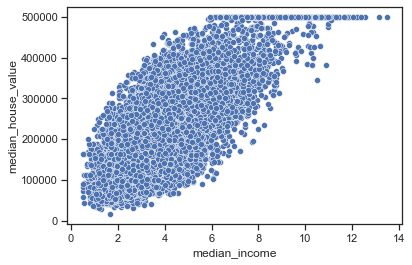

In [310]:
fig = sns.scatterplot(data=train_dataset2, x='median_income', y='median_house_value')

Im Vergleich zum ursprünglichen Trainings Set, welches im Kapitel EDA ausführlich analysiert wurde, wurden einige X- und Y-Ausreiser entfernt. Dadurch hat sich die waagrechte Punktelinie bei 500000$ _medin_house_value_ verkleinert und Ausreiser mit hohen X- und niedrigen Y-Werten wurden entfernt.

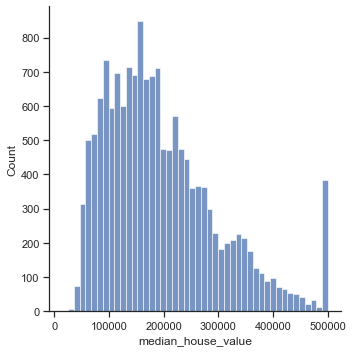

In [311]:
fig = sns.displot(data=train_dataset2, x='median_house_value')

Durch die Entfernung der Ausreiser hat sich das Histogramm von _median_house_value_ etwas weiter normalisiert.

In [34]:
# Fit Model without outliers
lm = smf.ols(formula='median_house_value ~ median_income + ocean_proximity + bedrooms_per_rooms + people_per_household', data=train_dataset2).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     8832.
Date:                Wed, 19 Jan 2022   Prob (F-statistic):               0.00
Time:                        12:37:35   Log-Likelihood:            -1.8925e+05
No. Observations:               15405   AIC:                         3.785e+05
Df Residuals:                   15399   BIC:                         3.786e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                      3.596e+04   4371.548      8.226      0.000    2.74e+04    4.45e+04
ocean_proximity[T.INLAND]     -6.127e+04   1092.791    -56.071      0.000   -6.34e+04   -5.91e+04
ocean_proximity[T.NEAR COAST]  6831.6716   1113.689      6.134      0.000    4648.711    9014.633
median_income                  4.676e+04    362.691    128.920      0.000     4.6e+04    4.75e+04
bedrooms_per_rooms             3.536e+05    1.2e+04     29.400      0.000     3.3e+05    3.77e+05
people_per_household          -2.532e+04    576.811    -43.895      0.000   -2.64e+04   -2.42e+04
==============================================================================
Omnibus:                      901.834   Durbin-Watson:                   1.985
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1114.776
Skew:                           0.584   Prob(JB):                    8.50e-243
Kurtosis:                       3.612   Cond. No.                         153.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Durch die Entfernung der Ausreiser haben sich R-squared, adjusted R-squared und F-statistics deutlich verbessert. <br>
AIC und BIC sind auch etwas kleiner geworden und haben sich somit verbessert. <br>
Die p-values der Features bleiben unverändert. <br>
Auch an den p-values für Jarque-Bera und Omnibus hat sich kaum etwas verändert. <br>

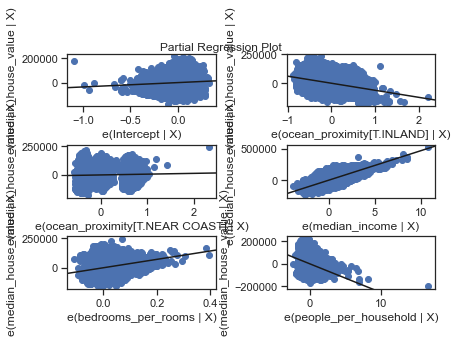

In [35]:
fig = sm.graphics.plot_partregress_grid(lm)
fig.tight_layout(pad=0.2)

Die Partial Regression Plots visualisieren die Relation einer unabhängigen Variablen in Verbindung mit den anderen unabhängigen Variablen im Modell in Bezug auf die abhängige Variable. <br>
Die Plots zeigen eine negative Abhängigkeit von der Ausprägung _I.INLAND_ von _ocean_proximity_ und _peope_per_household_. _Median_income_ und _bedrooms_per_rooms_ scheinen eine positive Abhängigkeit auf _median_house_value_ zu haben. Gemäß dem Diagramm hat die Variable _ocean_proximity[T.NEAR COAST]_ keinen Einfluss auf _median_income_. Dies steht im Gegensatz zum p-value 0,00 dieser Variablen, nach dessen Interpretation die Variable einen Einfluss auf die abhängige Variable hat.

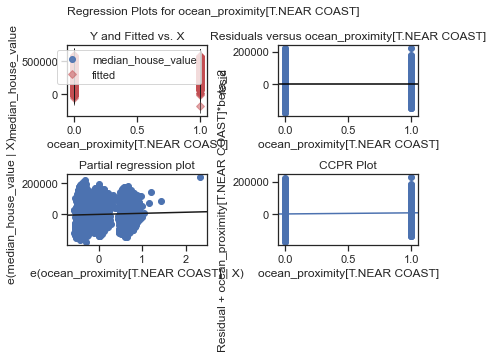

In [36]:
fig = sm.graphics.plot_regress_exog(lm, "ocean_proximity[T.NEAR COAST]")
fig.tight_layout(pad=1.0)

Auch diese Plots lassen darauf schließen, dass die Variable _ocean_proximity[T.NEAR COAST] das Modell nicht verbessert. Sowohl Partial Regression Plot als auch CCPR Plot visualisieren eine Nicht-Linearität zwischen der Variablen und _median_house_value_. <br>
Die Residuals scheinen dagegen gleichmäßig verteilt zu sein.

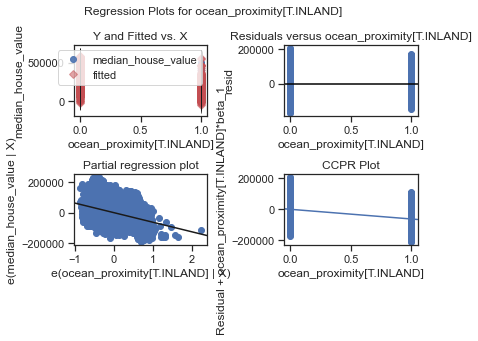

In [27]:
fig = sm.graphics.plot_regress_exog(lm, "ocean_proximity[T.INLAND]")
fig.tight_layout(pad=1.0)

Die negative Korrelation ist sowohl im Partial Regression Plot als auch im CCPR Plot zu erkennen. Die Residuals sind gleichmäßig verteilt und lassen daher auf Homoskedastizität rückschließen. Das Diagramm zu Y and Fitted vs. X ist aufgrund der vielen Datenpunkte schwer zu analysieren.

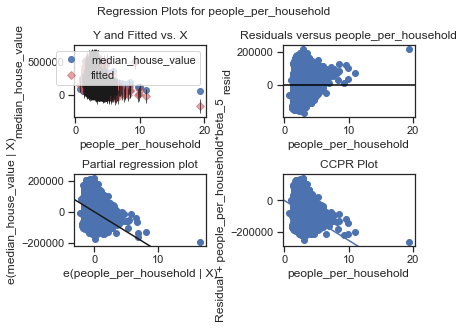

In [37]:
fig = sm.graphics.plot_regress_exog(lm, "people_per_household")
fig.tight_layout(pad=1.0)

Auch hier ist eine negative Abhängigkeit der abhängigen zur unabhängigen Variablen zu erkennen. Linearität scheint also vorzuliegen. Allerdings ist im Residual Plot keine konstante Varianz der Fehlerstreuung zu erkennen. Mit steigendem X-Wert verringert sich die Fehlerstreuung und liegt nur noch im positiven Bereich. Mit zunehmender _people_per_household_ wird tendenziell ein höherer _median_house_value_ mit dem Modell hervorgesagt, als tatsächlich vorliegt. Dies spiegelt sich auch im Plot zu Y and Fitted vs. X wieder. Bei dieser Variablen könnte Heteroskedastizität vorlieren. Dies gilt es mithilfe des Breusch-Pagan Lagrange Multiplier Tests genauer zu untersuchen:

In [44]:
name = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
test = sm.stats.het_breuschpagan(lm.resid, lm.model.exog)
lzip(name, test)

[('Lagrange multiplier statistic', 1043.0254994601257),
 ('p-value', 2.906700494490131e-223),
 ('f-value', 223.66770899896423),
 ('f p-value', 3.329323077460106e-231)]

Da alle Werte über 0,05 liegen, kann die Nullhypothese, Homoskedastizität, akzeptiert werden. Somit liegt keine Hetereoskedastizität (Korrelation der Fehlerterms) vor.

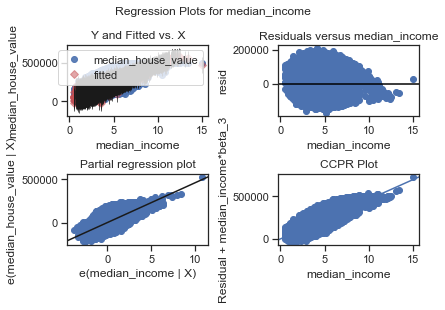

In [46]:
fig = sm.graphics.plot_regress_exog(lm, "median_income")
fig.tight_layout(pad=1.0)

Für _median_income_ ist die Linearität im Partial Regression Plot und CCPR Plot deutlich zu erkennen. Jedoch nimmt auch hier die Streuung der Residuals im höheren X-Wertebereich ab. 

Für das nächste Modell werden die Ausprägungen _NEAR COST_ und _<1H OCEAN_ zusammengefasst:

In [45]:
# write out a dict with the mapping of old to new
remap_cat_dict = {
    'NEAR COAST': 'NEAR COAST',
    'INLAND': 'INLAND',
    '<1H OCEAN': 'NEAR COAST' }

train_dataset.ocean_proximity = train_dataset.ocean_proximity.map(remap_cat_dict).astype('category')

#### Model 2 - OLS Regression


Nachfolgend wird ein weiteres Modell mit zusätzlicher Verwendung der Variablen _housing_median_age_ trainiert.

In [46]:
# Fit Model
lm2 = smf.ols(formula='median_house_value ~ median_income + ocean_proximity + bedrooms_per_rooms + people_per_household + housing_median_age', data=train_dataset).fit()
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     5598.
Date:                Wed, 19 Jan 2022   Prob (F-statistic):               0.00
Time:                        12:57:18   Log-Likelihood:            -2.0552e+05
No. Observations:               16339   AIC:                         4.110e+05
Df Residuals:                   16333   BIC:                         4.111e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -5.941e+04   4251.872    -13.972      0.000   -6.77e+04   -5.11e+04
ocean_proximity[T.NEAR COAST]  6.572e+04   1340.461     49.026      0.000    6.31e+04    6.83e+04
median_income                  4.432e+04    403.597    109.805      0.000    4.35e+04    4.51e+04
bedrooms_per_rooms             2.979e+05   1.28e+04     23.242      0.000    2.73e+05    3.23e+05
people_per_household          -1.439e+04    487.311    -29.524      0.000   -1.53e+04   -1.34e+04
housing_median_age             1009.9369     45.939     21.984      0.000     919.891    1099.983
==============================================================================
Omnibus:                     5235.108   Durbin-Watson:                   1.968
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34340.227
Skew:                           1.379   Prob(JB):                         0.00
Kurtosis:                       9.545   Cond. No.                         766.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared und adj. R-squared haben sich im Vergleich zum ersten Modell verbessert. <br>
Auch F-statistics hat sich durch die Entfernung der Ausprägung von _ocean_proximity_ und Aufnahme des Features _median_housing_age_ verbessert im Vegleich zu Modell 1 ohne Entfernung der Cook's Distance Outliers. <br>
Alle übrigen Kennzahlen haben sich kaum verändert.

In [47]:
# obtain Cook's distance 
lm_cooksd = lm2.get_influence().cooks_distance[0]

# get length of df to obtain n
n = len(train_dataset["median_income"])
print('n = ', n)

# calculate critical d
critical_d = 4/n
print('Critical Cooks distance:', critical_d)

# identification of potential outliers with leverage
out_d = lm_cooksd > critical_d

# output potential outliers with leverage
print(train_dataset.index[out_d], "\n", 
    lm_cooksd[out_d])

n =  16339
Critical Cooks distance: 0.0002448130240528796
Int64Index([15778,  6776, 10005, 11511,  7263, 15723, 14756, 15687,  4638,
            14806,
            ...
            15809,  8866,   199, 18498,    59, 10749,  8857, 13154,  5470,
            16642],
           dtype='int64', length=855) 
 [1.33657972e-03 3.30853996e-04 2.57049009e-04 3.39660405e-04
 6.01129532e-04 3.88602976e-04 1.90478556e-02 6.27488571e-04
 6.74476388e-04 4.45045388e-04 8.27915922e-04 1.30029194e-03
 1.22608518e-03 3.77876614e-04 5.13746812e-04 7.71608777e-04
 5.53086958e-04 2.60583344e-04 3.05990146e-04 5.38968511e-04
 3.38650064e-04 2.54349021e-04 4.32750022e-04 3.44212356e-04
 3.61317235e-04 3.67082550e-04 2.50921062e-04 2.64010646e-04
 5.64470925e-02 4.50645263e-04 4.32630903e-04 3.73737786e-04
 8.94441250e-04 5.17859249e-04 1.67765900e-03 2.15661985e-03
 1.05909753e-03 2.68151181e-04 6.29731152e-04 5.30310328e-04
 5.08429929e-03 5.19828279e-04 9.65158028e-04 4.65438401e-03
 4.30201917e-04 3.11323002

Auch in Modell lm2 werden mögliche outliers und Punkte mit high leverage identifiziert und aus dem Datenset entfernt.

In [48]:
#drop outliers identified by Cook's distance
train_dataset2 = train_dataset.drop(train_dataset.index[out_d])
train_dataset2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15484 entries, 14185 to 17879
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   housing_median_age    15484 non-null  int64   
 1   total_rooms           15484 non-null  int64   
 2   total_bedrooms        15484 non-null  int64   
 3   population            15484 non-null  int64   
 4   households            15484 non-null  int64   
 5   median_income         15484 non-null  float64 
 6   median_house_value    15484 non-null  float64 
 7   ocean_proximity       15484 non-null  category
 8   people_per_household  15484 non-null  float64 
 9   rooms_per_household   15484 non-null  float64 
 10  bedrooms_per_people   15484 non-null  float64 
 11  bedrooms_per_rooms    15484 non-null  float64 
dtypes: category(1), float64(6), int64(5)
memory usage: 1.4 MB


In [49]:
# Fit Model
lm2 = smf.ols(formula='median_house_value ~ median_income + ocean_proximity + bedrooms_per_rooms + people_per_household + housing_median_age', data=train_dataset2).fit()
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.746
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     9085.
Date:                Wed, 19 Jan 2022   Prob (F-statistic):               0.00
Time:                        14:04:48   Log-Likelihood:            -1.9034e+05
No. Observations:               15484   AIC:                         3.807e+05
Df Residuals:                   15478   BIC:                         3.807e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -4.951e+04   4086.781    -12.115      0.000   -5.75e+04   -4.15e+04
ocean_proximity[T.NEAR COAST]  5.763e+04   1060.730     54.330      0.000    5.56e+04    5.97e+04
median_income                  4.857e+04    368.630    131.763      0.000    4.78e+04    4.93e+04
bedrooms_per_rooms             3.637e+05   1.19e+04     30.623      0.000     3.4e+05    3.87e+05
people_per_household          -2.752e+04    578.566    -47.572      0.000   -2.87e+04   -2.64e+04
housing_median_age              923.2678     36.548     25.262      0.000     851.629     994.907
==============================================================================
Omnibus:                     1031.972   Durbin-Watson:                   1.988
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1351.257
Skew:                           0.610   Prob(JB):                    3.79e-294
Kurtosis:                       3.778   Cond. No.                         912.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Die Modellperformance liegt nun bei 74,6% und ist somit bisher der beste erzielte Wert der Kennzahl R-squared. <br>
F-statistics hat sich ebenfalls verbessert. <br>
Alle anderen Werte liegen in einem ähnlichen Wertebereich.

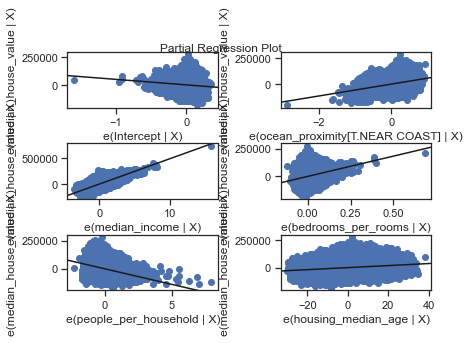

In [50]:
fig = sm.graphics.plot_partregress_grid(lm2)
fig.tight_layout(pad=0.2)

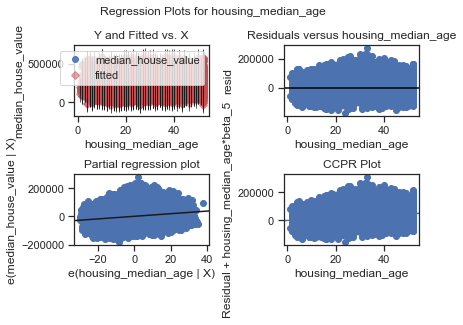

In [51]:
fig = sm.graphics.plot_regress_exog(lm2, "housing_median_age")
fig.tight_layout(pad=1.0)

Das Partial Regression Plot und CCPR Plot zeigen eine geringe lineare Korrelation von _housing_median_age_ in Verbindung mit den anderen unabhängigen Variablen auf _median_house_value_. <br>
Das Residual Plot zeigt eine deutliche Homoskedastizität.

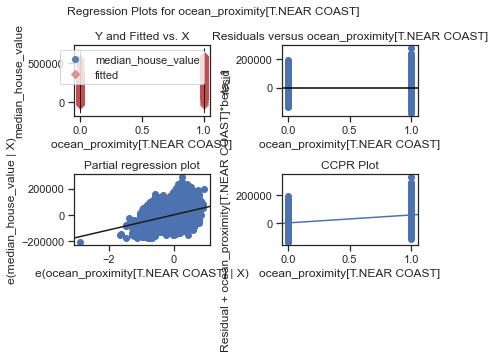

In [52]:
fig = sm.graphics.plot_regress_exog(lm2, "ocean_proximity[T.NEAR COAST]")
fig.tight_layout(pad=1.0)

Durch die Zusammenlegung der Ausprägungen _<1H OCEAN_ und _NEAR COST_ hat ds Feature nun eine positive lineare Abhängigkeit zu _median_house_value_. Die Fehlerstreuung ist bei etwas größer bei _NEAR COAST_ = 1, das Distrikt also in der Nähe zum Meer liegt. Auch hier wird vorsichtshalber der Breusch-Pagan Lagrange Multiplier Test zum Ausschluss von Heteroskedastizität durchgeführt.

In [53]:
name = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
test = sm.stats.het_breuschpagan(lm2.resid, lm2.model.exog)
lzip(name, test)

[('Lagrange multiplier statistic', 1095.2984925363032),
 ('p-value', 1.3939938205969558e-234),
 ('f-value', 235.64364107050312),
 ('f p-value', 2.5613416182330695e-243)]

Da alle p-values über 0,05 liegen, kann Heteroskedastizität ausgeschlossen werden.

In der linearen Regression muss eine Colinearität der unabhängigen Variablen unbedingt vermieden werden. Mithilfe des Variance Inflation Factors (VIF) kann der Grad der Colinearität der im Modell verwendeten Variablen berechnet werden. Der kleinstmögliche Wert ist 1. Problematisch wird es ab Werten > 5.

In [55]:
# choose features and add constant
features = add_constant(train_dataset2[['median_income', 'bedrooms_per_rooms', 'people_per_household', 'housing_median_age']])
# create empty DataFrame
vif = pd.DataFrame()
# calculate vif
vif["VIF Factor"] = [variance_inflation_factor(features.values, i) for i in range(features.shape[1])]
# add feature names
vif["Feature"] = features.columns

vif.round(2)

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,Feature
0,83.61,const
1,1.80,median_income
2,1.79,bedrooms_per_rooms
3,1.01,people_per_household
4,1.03,housing_median_age


Der Wert der Konstanten kann ignoriert werden. Ansonsten ist die Colinearität der Variablen eher gering.

Die Modelle lm und lm2 sind sehr ähnlich. R-squared ist bei lm2 ca. 1% besser, auch der Wert von F-statistics hat sich von lm zu lm2 verbessert. AIC und BIC haben sich dagegen minimal verschlechtert Das Partial Regression Plot der Variablen _median_housing_age_ zeigt zwar nur eine geringe Linearität, dennoch scheint die Aufnahme der Variablen das Modell etwas zu verbessern. Daher verwenden die nachfolgenden Modelle die in lm2 verwendeten Features.

#### Model 2 - Lasso Regression

Nachfolgend wird eine Lasso Regression mit statsmodels fit_regularized() Methode trainiert. Der Wert von alpha wird auf 5 gesetzt.

In [56]:
lasso1 = smf.ols(formula='median_house_value ~ median_income + ocean_proximity + bedrooms_per_rooms + people_per_household + housing_median_age', data=train_dataset2).fit_regularized(method='sqrt_lasso', alpha=5.0, L1_wt=1.0, max_iter=1000)

In [57]:
print("Parameters: ", lasso1.params)

Parameters:  Intercept                        -44272.058534
ocean_proximity[T.NEAR COAST]     58127.019057
median_income                     48170.671059
bedrooms_per_rooms               346772.197084
people_per_household             -27621.154742
housing_median_age                  917.516632
dtype: float64


Da die Summary() Methode für statsmodels fit_regularized() Medelle nicht verfügbar ist, müssen wichtige Kennzahlen selbst berechnet werden.

In [58]:
# calculate the mean 
train_dataset2['average'] = train_dataset2["median_house_value"].mean()

# calculate error (observation - average) and assign it to dataframe
train_dataset2 = train_dataset2.assign(error = (train_dataset2['median_house_value'] - train_dataset2['average']))

# calculate squared error and assign it to dataframe
train_dataset2 = train_dataset2.assign(error_sq = (train_dataset2['median_house_value'] - train_dataset2['average'])**2)


# obtain predicted value from model lasso
train_dataset2['pred'] = lasso1.predict()

# obtain the residuals from statsmodel (resid)
train_dataset2['error_2'] = train_dataset2['median_house_value'] - train_dataset2['pred']

# square the residuals 
train_dataset2['error_sq_2'] = train_dataset2['error_2']**2

# show df
train_dataset2.head(5)

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms,average,error,error_sq,pred,error_2,error_sq_2
14185,37,2176,418,1301,375,2.8750,98900.0,NEAR COAST,3.469333,5.802667,0.321291,0.192096,196573.25704,-97673.25704,9.540065e+09,157080.171533,-58180.171533,3.384932e+09
6125,20,3158,684,2396,713,3.5250,153000.0,NEAR COAST,3.360449,4.429173,0.285476,0.216593,196573.25704,-43573.25704,1.898629e+09,184295.786398,-31295.786398,9.794262e+08
14095,11,2393,726,1905,711,1.3448,91300.0,NEAR COAST,2.679325,3.365682,0.381102,0.303385,196573.25704,-105273.25704,1.108246e+10,119926.953213,-28626.953213,8.195025e+08
14359,52,1260,202,555,209,7.2758,345200.0,NEAR COAST,2.655502,6.028708,0.363964,0.160317,196573.25704,148626.74296,2.208991e+10,394291.589328,-49091.589328,2.409984e+09
18004,32,2930,481,1336,481,6.4631,344100.0,NEAR COAST,2.777547,6.091476,0.360030,0.164164,196573.25704,147526.74296,2.176414e+10,334755.756942,9344.243058,8.731488e+07


In [59]:
# calculate sum of squared error (which is in case of the mean the total error)
TSS = train_dataset2.error_sq.sum()
# print output
print('Sum of squared error (TSS) of model 1:', TSS)

# Sum of squared residuals (SS_R)
SSR = train_dataset2['error_sq_2'].sum()
print('Sum of squared residuals (SSR) of model 1:',SSR)

Sum of squared error (TSS) of model 1: 169695617828075.0
Sum of squared residuals (SSR) of model 1: 43134248561958.78


In [60]:
# Explained sum of squares  (SS_M = TSS - SS_R)
SSM = TSS - SSR
print('SSM of Lasso Model: ', SSM)

# R_Squared: explained sum of squared residuals
R_squared = SSM / TSS
print('R squared Lasso Model:', R_squared)

SSM of Lasso Model:  126561369266116.22
R squared Lasso Model: 0.7458140103201739


R-squared ist durch die Regularisierung nochmal etwas besser geworden.<br>
Für einen optimalen Wert von alpha müsste eigentlich eine Cross-Validation durchgeführt werden. Darauf wird an dieser Stelle jedoch verzichtet.

#### Model 3 - Cubic Spline

Nun wird eine Cubic Spline unter Verwendung von Patsy und Statsmodels trainiert. Eine Verwendung von mehreren unabhängigen Variablen ist dabei nicht ohne Weiteres möglich. Daher wird nachfolgend lediglich die Variable mit der höchsten Korrelation zu _median_house_value_ verwendet. Dabei handelt es sich um _median_income_.

In [61]:
X_train = train_dataset2['median_income']
y_train = train_dataset2['median_house_value']
X_test = test_dataset['median_income']
y_test = test_dataset['median_house_value']


In [62]:
from patsy import dmatrix

# Generating cubic spline with 3 knots at 25, 40 and 60
transformed_x = dmatrix(
            "bs(train, knots=(3,6,9), degree=3, include_intercept=False)", 
                {"train": X_train},return_type='dataframe')

In [63]:
# Fitting generalised linear model on transformed dataset
spline1 = sm.GLM(y_train, transformed_x).fit()

In [64]:
spline1.predict()
spline1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:     median_house_value   No. Observations:                15484
Model:                            GLM   Df Residuals:                    15477
Model Family:                Gaussian   Df Model:                            6
Link Function:               identity   Scale:                      4.5931e+09
Method:                          IRLS   Log-Likelihood:            -1.9421e+05
Date:                Wed, 19 Jan 2022   Deviance:                   7.1087e+13
Time:                        14:14:30   Pearson chi2:                 7.11e+13
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
====================================================================================================================================
                                                                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                          1.08e+05   8224.837     13.135      0.000    9.19e+04    1.24e+05
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[0] -3.733e+04   1.09e+04     -3.439      0.001   -5.86e+04   -1.61e+04
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[1]  7.416e+04   7387.742     10.038      0.000    5.97e+04    8.86e+04
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[2]  1.573e+05   9964.123     15.782      0.000    1.38e+05    1.77e+05
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[3]  4.465e+05   1.06e+04     42.023      0.000    4.26e+05    4.67e+05
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[4]  3.512e+05   1.97e+04     17.846      0.000    3.13e+05     3.9e+05
bs(train, knots=(3, 6, 9), degree=3, include_intercept=False)[5]  4.248e+05   4.12e+04     10.307      0.000    3.44e+05    5.06e+05
====================================================================================================================================
"""

In [65]:
# obtain predicted value from model spline
train_dataset2['pred_spline'] = spline1.predict()

# obtain the residuals from statsmodel (resid)
train_dataset2['error_2_spline'] = train_dataset2['median_house_value'] - train_dataset2['pred_spline']

# square the residuals 
train_dataset2['error_sq_2_spline'] = train_dataset2['error_2_spline']**2

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,...,bedrooms_per_rooms,average,error,error_sq,pred,error_2,error_sq_2,pred_spline,error_2_spline,error_sq_2_spline
14185,37,2176,418,1301,375,2.8750,98900.0,NEAR COAST,3.469333,5.802667,...,0.192096,196573.25704,-97673.25704,9.540065e+09,157080.171533,-58180.171533,3.384932e+09,154242.775962,-55342.775962,3.062823e+09
6125,20,3158,684,2396,713,3.5250,153000.0,NEAR COAST,3.360449,4.429173,...,0.216593,196573.25704,-43573.25704,1.898629e+09,184295.786398,-31295.786398,9.794262e+08,183202.797434,-30202.797434,9.122090e+08
14095,11,2393,726,1905,711,1.3448,91300.0,NEAR COAST,2.679325,3.365682,...,0.303385,196573.25704,-105273.25704,1.108246e+10,119926.953213,-28626.953213,8.195025e+08,96483.272131,-5183.272131,2.686631e+07
14359,52,1260,202,555,209,7.2758,345200.0,NEAR COAST,2.655502,6.028708,...,0.160317,196573.25704,148626.74296,2.208991e+10,394291.589328,-49091.589328,2.409984e+09,372203.127060,-27003.127060,7.291689e+08
18004,32,2930,481,1336,481,6.4631,344100.0,NEAR COAST,2.777547,6.091476,...,0.164164,196573.25704,147526.74296,2.176414e+10,334755.756942,9344.243058,8.731488e+07,319584.526302,24515.473698,6.010085e+08


In [66]:
# Sum of squared residuals (SSR)
SSR_spline = train_dataset2['error_sq_2_spline'].sum()
print('Sum of squared residuals (SSR) of Cubic Spline:',SSR_spline)

# Explained sum of squares  (SS_M = TSS - SS_R)
SSM_spline = TSS - SSR_spline
print('SSM of Cubic Spline: ', SSM_spline)

# R_Squared: explained sum of squared residuals
R_squared_spline = SSM_spline / TSS
print('R squared of Cubic Spline:', R_squared_spline)

Sum of squared residuals (SSR) of Cubic Spline: 71087433258433.94
SSM of Cubic Spline:  98608184569641.06
R squared of Cubic Spline: 0.581088573952126


R squared ist schlechter geworden als in den vorherigen Modellen. Allerdings liegt dies darin begründet, dass nur ein Feature verwendet wurde. Ein direkter Vergleich ist also nicht möglich.

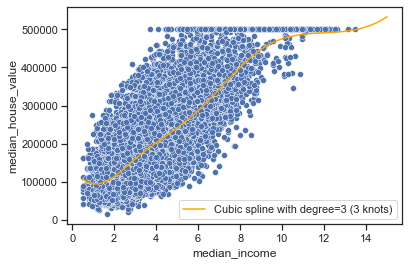

In [68]:
# Create observations
xp = np.linspace(X_test.min(),X_test.max(), 100)
# Make some predictions
pred = spline1.predict(dmatrix("bs(xp, knots=(3, 6, 9), include_intercept=False)", {"xp": xp}, return_type='dataframe'))

# plot
sns.scatterplot(x=X_train, y=y_train)

plt.plot(xp, pred, label='Cubic spline with degree=3 (3 knots)', color='orange')
plt.legend();

#### Model 4 - Natural Spline

In [69]:
transformed_x3 = dmatrix("cr(train,df = 3)", {"train": X_train}, return_type='dataframe')

spline2 = sm.GLM(y_train, transformed_x3).fit()

In [71]:
# obtain predicted value from model spline
train_dataset2['pred_spline'] = spline2.predict()

# obtain the residuals from statsmodel (resid)
train_dataset2['error_2_spline'] = train_dataset2['median_house_value'] - train_dataset2['pred_spline']

# square the residuals 
train_dataset2['error_sq_2_spline'] = train_dataset2['error_2_spline']**2

In [72]:
# Sum of squared residuals (SSR)
SSR_spline = train_dataset2['error_sq_2_spline'].sum()
print('Sum of squared residuals (SSR) of Natural Spline:',SSR_spline)

# Explained sum of squares  (SS_M = TSS - SS_R)
SSM_spline = TSS - SSR_spline
print('SSM of Natural Spline: ', SSM_spline)

# R_Squared: explained sum of squared residuals
R_squared_spline = SSM_spline / TSS
print('R squared of Natural Spline:', R_squared_spline)

Sum of squared residuals (SSR) of Natural Spline: 72042025549993.14
SSM of Natural Spline:  97653592278081.86
R squared of Natural Spline: 0.5754632531349064


R-squared ist im Vergleich zur Cubic Spline nochmal gesunken. Auch hier wird im Modell nur eine unabhängige Variable verwendet.

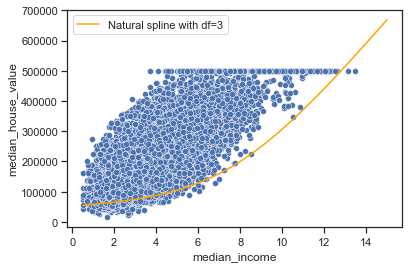

In [73]:
# Make predictions
pred = spline2.predict(dmatrix("cr(xp, df=3)", {"xp": xp}, return_type='dataframe'))

# plot
sns.scatterplot(x=X_train, y=y_train)
plt.plot(xp, pred, color='orange', label='Natural spline with df=3')
plt.legend()

### Scikit Learn

#### Data Preprocessing Pipeline

Initialisierung der Preprocessing Pipeline. Mithilfe einer Preprocessing Pipelines müssen die Daten nicht manuell transformiert werden, da diesse Aufgaben von der Pipeline übernommen werden. <br>
Für numerische Variablen gehört dazu die Normalisierung der Variablen, sowie die Belegung nicht befüllter Datensätze mit dem Durchschnittswert des Features. <br>
Bei kategorialen Variablen werden fehlnde Werte durch eine Konstante belegt und automatisiert Dummy Variablen für die verschiedenen Ausprägungen der Variablen erzeugt.

In [74]:
# for numeric features
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()) #Normalisierung (X=(X-Mittelwert) / Standardabweichung)
    ])

In [75]:
# for categorical features  
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')), #Konstante bei fehlenden Werten reinschreiben
    ('onehot', OneHotEncoder(handle_unknown='ignore')) #pro Featureausprägung eine Spalte, zutreffendes Feature hat dann Wert 1 und die anderen Wert 0
    ])

In [76]:
# Pipeline
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, selector(dtype_exclude="category")),
    ('cat', categorical_transformer, selector(dtype_include="category"))
        ])

#### Datenvorbereitung

Für Scikit Learn muss die abhängige Variable von den unabhängigen getrennt werden. Als Datenbasis wird hier auf train_dataset2 zugegriffen. In diesem Datenset wurden die Outlier nach Cook's Distance bereits entfernt. Als Features sollen die durch die Filter Methode identifizierten und bereits in statsmodels verwendeten Features genutzt werden.

In [77]:
# create label y
y = train_dataset2['median_house_value']

# create features
X= train_dataset2[['median_income', 'ocean_proximity', 'bedrooms_per_rooms', 'people_per_household', 'housing_median_age']]


Scikit Learn bietet eine eigene Methode zum Datensplitting. Das Datenset train_dataset2 aus statsmodels wird nun nochmal in Test- und Trainingsdaten aufgeteilt. Dadurch ist Validierung der Modelle bereits mit diesem Testset möglich, bevor am Ende dieses Notebooks mit den bereits zu Beginn zur Seite gelegten Testdaten das beste Modell evaluiert wird.

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [79]:
print("Training size:", len(X_train))
print("Test size:", len(X_test))

Training size: 12387
Test size: 3097


#### Model 5 - Simple Regression

Nun wird ein Pipeline Object erzeugt, welches zunächst die Data Preprocessing Pipeline ausführt und anschließend das Regressionsmodell.

In [80]:
# Create pipeline with model
lm_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('lm', LinearRegression())
                        ])

# Fit model
lm_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000222F09495B0>),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
      

In der Variable features_names werden die Namen der Features gespeichert.

In [81]:
feature_names = np.concatenate((X_train.drop(['ocean_proximity'], axis=1).columns.to_numpy(), lm_pipe.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out()))
feature_names

array(['median_income', 'bedrooms_per_rooms', 'people_per_household',
       'housing_median_age', 'x0_INLAND', 'x0_NEAR COAST'], dtype=object)

Der eben erzeugte feature_names Array kann nun mit den Koeffizienten des Modells ergänzt werden, um die Koeffizienten je Feature auszugeben.

In [82]:
# Obtain model coefficients and names
print('Koeffizienten und Namen: \n', list(zip(lm_pipe.named_steps['lm'].coef_, feature_names)))

Koeffizienten und Namen: 
 [(84852.55471482786, 'median_income'), (18735.049763174888, 'bedrooms_per_rooms'), (-19963.944594294095, 'people_per_household'), (11488.308364831402, 'housing_median_age'), (-28587.94998804061, 'x0_INLAND'), (28587.949988040604, 'x0_NEAR COAST')]


Das trainierte Modell wird nun für die Berechnung der _median_house_values_ der Trainingsdaten verwendet.

In [83]:
y_pred = lm_pipe.predict(X_train)
y_pred

array([113004.32375212, 163416.09509259, 104877.65553309, ...,
        45560.80974401, 306094.8367317 , 117268.25027873])

In [84]:
# Metrics trainings set
print('R squared training set:', round(skm.r2_score(y_train, y_pred)*100, 2))
print('MSE training set:', round(skm.mean_squared_error(y_train, y_pred), 2))
print('RMSE training set:', round(skm.mean_squared_error(y_train, y_pred, squared=False), 2))

R squared training set: 74.47
MSE training set: 2777618420.95
RMSE training set: 52703.12


Das Modell hat einen ähnlichen R-squared wie die OLS Regression in statsmodels. Der Root Mean Squared Error des Modells beträgt 52703,12$. Das bedeutet, dass der eigentliche Wert von _median_house_value_ im Schnitt um diesen Betrag von dem durch das Modell berechneten Ergebnis abweicht. 

Im Folgenden wird das Modell mit den im Scikit Learn Datensplit erzeugten Validierungsdaten getestet.

In [85]:
# Validation data
pred = lm_pipe.predict(X_test)
r2_test = round(skm.r2_score(y_test, pred)*100, 2)
print('R squared validation set:', r2_test)
mse_test =skm.mean_squared_error(y_test, pred)
print('MSE validation set', round(mse_test, 2))
print('RMSE training set:', round(skm.mean_squared_error(y_test, pred, squared=False), 2))

R squared validation set: 75.04
MSE validation set 2816769494.14
RMSE training set: 53073.25


Der R-squared Wert hat sich mit den Validierungsdaten verbessert. Dies ist sehr ungewöhnliche, da unter Verwendung unbekannter Variablen die Metriken normalerweise etwas schlechtere Werte einnehmen. Dies könnte allerdings darin begründet sein, dass mit diesen Validierungsdaten bereits EDA, Feature Engineering und auch Cook's Distance Outlier Entfernung durchgeführt wurde. <br>
Der durchschnittliche Fehler MSE und auch die durchschnittliche Abweichung von berechneten zu tatsächlichen Modellen sind etwas schlechter geworden. Allerdings nur geringfügig. Das Modell wird daher als gut erachtet. 

#### Model 6 - Lasso

##### vorgegebenes Alpha

In diesem Unterkapitel wird eine Lasso Regression für das Modell durchgeführt. Der Wert für alpha wird initial mit 1 belegt.

In [87]:
# Create pipeline with model
lasso_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('lasso', Lasso(alpha=1, max_iter=10000))
                        ])

lasso_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000222F09495B0>),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
      

In [88]:
# Metrics trainings set
pred_train = lasso_pipe.predict(X_train)
print('R squared training set:', round(skm.r2_score(y_train, pred_train)*100, 2))
print('MSE training set:', round(skm.mean_squared_error(y_train, pred_train), 2))
print('RMSE training set:', round(skm.mean_squared_error(y_train, pred_train, squared=False), 2))

R squared training set: 74.47
MSE training set: 2777618427.33
RMSE training set: 52703.12


R-squared der Lasso Regression hat sich im Vergleich zur Simple Regression im Modell zuvor nicht verändert. Auch MSE und RMSE sind gleich geblieben. Dies ist auf den initial gewählten, sehr kleinen Wert für alpha von 1 zurückzuführen. Ein geringer Wert in Alpha verändert die Höhe der Koeffizienten im Modell kaum. Daher bleiben auch die Berechnungen des Modells unverändert und somit die Metriken. 

In [268]:
# Metrics validation set
pred = lasso_pipe.predict(X_test)
print('R squared validation set:', round(skm.r2_score(y_test, pred)*100, 2))
print('MSE validation set:', round(skm.mean_squared_error(y_test, pred), 2))
print('RMSE validation set:', round(skm.mean_squared_error(y_test, pred, squared=False), 2))

R squared validation set: 74.67
MSE validation set: 2877369775.47
RMSE validation set: 53641.12


Auch die Metriken des Validation Set haben sich nicht verändert im Vergleich zur Simple Regression.

In [99]:
# Obtain model coefficients and names
print('Koeffizienten und Namen: \n', list(zip(lasso_pipe.named_steps['lasso'].coef_, feature_names)))

Koeffizienten und Namen: 
 [(84852.14248638194, 'median_income'), (18734.010558726382, 'bedrooms_per_rooms'), (-19962.92053743495, 'people_per_household'), (11487.952227452783, 'housing_median_age'), (-57171.981131734494, 'x0_INLAND'), (3.3287087880073534e-11, 'x0_NEAR COAST')]


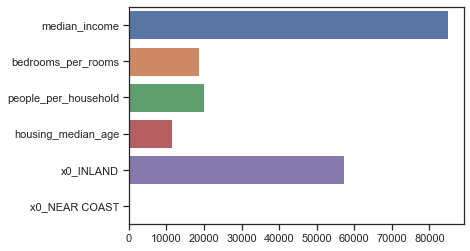

In [90]:
# get absolute values of coefficients
importance = np.abs(lasso_pipe.named_steps['lasso'].coef_)

sns.barplot(x=importance, 
            y=feature_names);

Das Diagramm visualiert die Feature Importance. Je länger der Balken, desto eine höhere Gewichtung bekommt das Feature im Modell. Die Feature Importance ergibt sich auch den Koeffizienten der Features. _median_income_ ist das wichtigste Feature im Modell, wie an dem großen Balken sowie dem Koeffizienten des Features zu erkennen. <br>
Die Ausprägung _NEAR COAST_ der Variablen _ocean_proximity_ wurde von der Lasso Regression aus der Regression fast entfernt. Dieses Verhalten ist bei Lasso gewünscht. Durch die L1-Regularisierung mit alpha führt der Algorithmus automatisch eine Feature Selection durch. Dabei werden relevante Features durch höhere Koeffizienten stärker gewichtet und unwichtige Features durch kleinere Koeffizienten schäwcher gewichtet bzw. sogar komplett aus dem Modell entfernt, indem der Koeffizient auf den Wert 0 reduziert wird. Durch diese Methode soll ein overfitting des Modells durch zu viele Variablen verhindert werden.

#### k-fold cross validation zur Ermittlung von alpha

In [91]:
from sklearn.linear_model import LassoCV

# Lasso with 5 fold cross-validation
model_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('lassoCV', LassoCV(cv=5, random_state=0, max_iter=10000))
                        ])
# Fit model
model_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000222F09495B0>),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
      

In [92]:
#Show best value of penalization chosen by cross validation:
alpha = model_pipe.named_steps['lassoCV'].alpha_
print('Best alpha chosen by cross validation:', alpha)

Best alpha chosen by cross validation: 79.0619710978722


Auf Basis von k-fold cross validation wurde der beste Wert für Alpha ermittelt. Dieser liegt bei 79,06. Bei k-fold cross validation wird das Trainingsdatenset nochmal in k kleinere Datensets unterteilt. Eines Dieser kleineren Datensets wird zur Seite gelegt und das Modell mithilfe der anderen und einem Wert für Alpha trainiert. Anschließend wird mit dem zur Seite gelegten kleinen Datenset eine Validierung des Modells mit den unbekannten Daten durchgeführt. <br>
Dieser Vorgang wird für jedes der k - Datensets für verschiedene Werte von Alpha wiederholt. Das Alpha mit dem besten Ergebnis bei der Validierung wird hier ausgegeben.

Mit dem zuvor ermittelten, besten Wert von Alpha wird nun noch ein finales Lasso Modell auf Basis aller Trainingsdaten trainiert.

In [93]:
# Set best alpha
lasso_best_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('lasso_best', Lasso(alpha=alpha))
                        ])
lasso_best_pipe.fit(X_train, y_train)
lasso_best = lasso_best_pipe.named_steps['lasso_best']

In [98]:
print('Model coefficients and names: \n', list(zip(lasso_best.coef_, feature_names)))

Model coefficients and names: 
 [(84682.01192725677, 'median_income'), (18560.71403670962, 'bedrooms_per_rooms'), (-19890.4973463913, 'people_per_household'), (11429.85201175577, 'housing_median_age'), (-56979.210567451206, 'x0_INLAND'), (5.031471360334191e-11, 'x0_NEAR COAST')]


Durch den größeren Wert von Alpha wurden die Koeffizienten der einzelnen Features etwas verkleinert. _median_income_ hatte zuvor bei alpha=1 beispielsweise einen Wert von 84852,14. Nun liegt der Wert bei 84682,01. 

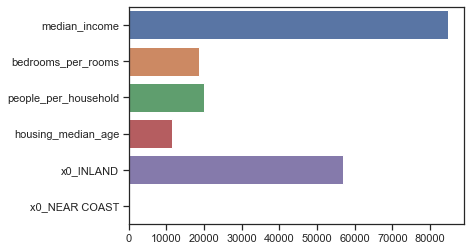

In [95]:
# get absolute values of coefficients
importance = np.abs(lasso_best.coef_)

sns.barplot(x=importance, 
            y=feature_names);

An der Reihenfolge der Feature Importance hat sich durch die Veränderung von Alpha wenig verändert.

In [96]:
# Metrics trainings set
pred_train = lasso_best_pipe.predict(X_train)
print('R squared training set:', round(skm.r2_score(y_train, pred_train)*100, 2))
print('MSE training set:', round(skm.mean_squared_error(y_train, pred_train), 2))
print('RMSE training set:', round(skm.mean_squared_error(y_train, pred_train, squared=False), 2))

R squared training set: 74.47
MSE training set: 2777671055.36
RMSE training set: 52703.62


In [97]:
# Metrics tests set
pred = lasso_best_pipe.predict(X_test)
print('R squared validation set:', round(skm.r2_score(y_test, pred)*100, 2))
print('MSE validation set:', round(skm.mean_squared_error(y_test, pred), 2))
print('RMSE validation set:', round(skm.mean_squared_error(y_test, pred, squared=False), 2))

R squared validation set: 75.03
MSE validation set: 2817208350.85
RMSE validation set: 53077.38


Da sich die Koeffizienten durch den neuen Wert von Alpha kaum verändert haben, sind auch die Kennzahlen zur Performance Messung des Modells unverändert. 

#### Model 7 - Natural Splines

In diesem Modell wird eine scikit learn spline in Kombination mit einer Data Preprocessing Pipeline trainiert.

In [100]:
# use a spline wit 4 knots and 3 degrees with a ridge regressions
spline = make_pipeline(SplineTransformer(n_knots=4, degree=3), 
                       Ridge(alpha=1))

# Integrate Preprocessor Pipeline
spline_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('spline', spline)
                        ])
                     
spline_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000222F09495B0>),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
      

In [101]:
# Metrics trainings set
pred_train = spline_pipe.predict(X_train)
print('R squared training set:', round(skm.r2_score(y_train, pred_train)*100, 2))
print('MSE training set:', round(skm.mean_squared_error(y_train, pred_train), 2))
print('RMSE training set:', round(skm.mean_squared_error(y_train, pred_train, squared=False), 2))

R squared training set: 75.36
MSE training set: 2680356009.84
RMSE training set: 51772.15


In [102]:
# Metrics tests set
pred = spline_pipe.predict(X_test)
print('R squared validation set:', round(skm.r2_score(y_test, pred)*100, 2))
print('MSE validation set:', round(skm.mean_squared_error(y_test, pred), 2))
print('RMSE validation set:', round(skm.mean_squared_error(y_test, pred, squared=False), 2))

R squared validation set: 76.19
MSE validation set: 2687000792.6
RMSE validation set: 51836.29


Durch die Verwendung der Spline hat sich das Modell in Bezug auf R-sqared und auch RMSE nochmal verbessert. Das Modell deckt nun 75,36% der Varianz (Testdaten) bzw. 76,19% der Validationsdaten ab. Die durchschnittliche Abweichung der tatsächlichen Werten zu den berechneten Werten beträgt ca. 51800$.

C:\Users\Admin\AppData\Local\Temp/ipykernel_5788/3121680389.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



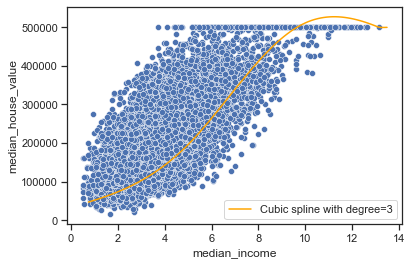

In [103]:
# Create observations
xp = pd.DataFrame(data=np.linspace(X_test.min(),X_test.max(), 100), columns = X_train.drop(['ocean_proximity'], axis=1).columns)
xp = xp.assign(ocean_proximity=lambda xp: 'INLAND')


# Make some predictions
pred_new = spline_pipe.predict(xp)

# plot
sns.scatterplot(x=X_train['median_income'], y=y_train)

plt.plot(xp['median_income'], pred_new, label='Cubic spline with degree=3', color='orange')
plt.legend();

## Evaluierung der besten 2 Modelle mit Test Datenset

In diesem Kapitel wird eine Evaluierung der zwei besten Modellen mithilfe der zu Beginn beiseite gelegten Testdaten durchgeführt.<br>
Zunächst müssen die Testdaten transformiert werden, sodass sie in gleicher Form wie die Trainingsdaten vorliegen und von den Modellen verwendet werden können.

In [104]:
# write out a dict with the mapping of old to new
remap_cat_dict = {
    'NEAR OCEAN': 'NEAR COAST',
    'NEAR BAY': 'NEAR COAST',
    'INLAND': 'INLAND',
    '<1H OCEAN': 'NEAR COAST',
    'ISLAND' : 'NEAR COAST'}

test_dataset.ocean_proximity = test_dataset.ocean_proximity.map(remap_cat_dict).astype('category')

In [105]:
y_test = test_dataset['median_house_value']

X_test = test_dataset[['median_income', 'ocean_proximity', 'bedrooms_per_rooms', 'people_per_household', 'housing_median_age']]

### Evaluation Statsmodels OLS lm2

In [106]:
# Metrics tests set
X_test = X_test.assign(pred_test1=lambda X_test: lm2.predict(X_test))
r2_test1 = round(skm.r2_score(y_test, X_test.pred_test1)*100, 2)
print('R squared Statsmodels OLS with Test Set:', r2_test1)
print('MSE Statsmodels OLS with Test Set:', round(skm.mean_squared_error(y_test, X_test.pred_test1), 2))
print('RMSE Statsmodels OLS with Test Set:', round(skm.mean_squared_error(y_test, X_test.pred_test1, squared=False), 2))

R squared Statsmodels OLS with Test Set: -10.35
MSE Statsmodels OLS with Test Set: 14459492747.15
RMSE Statsmodels OLS with Test Set: 120247.63


R-squared ist in Model lm2 negativ. Somit generalisiert das Modell schlecht auf unbekannte Testdaten und stellt sogar eine Verschlechterung im Vergleich zur Verwendung des Durchschnitts als Modell dar. <br>
Grund dafür könnte ein Overfitting während dem Modellierungsprozess sein. <br>
Root Mean Squared Error und somit eine durchschnittliche Abweichung von tatsächlichem und berechnetem _median_house_value_ in Höhe von 120247,63,95$ ist ebenso kein zufriedenstellendes Ergebnis.

Die berechneten Werte sollen in einem Scatterplot den tatsächlichen Werten gegenübergestellt werden. Aufgrund der Datenmenge sollen nur einige Datensätze visualisiert werden. Mithilfe eines Data Splittings werden zufällig einige Datenpunkte ausgewählt.

In [107]:
X_notplot, X_plot, y_notplot, y_plot = train_test_split(X_test, y_test, test_size=0.1, random_state=10)

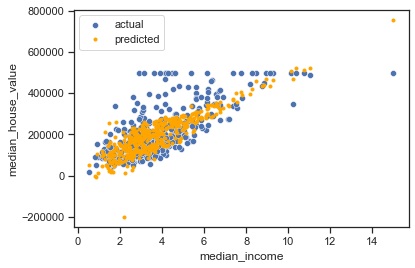

In [108]:
# plot
sns.scatterplot(x=X_plot['median_income'], y=y_plot, label='actual')

plt.plot(X_plot['median_income'], X_plot['pred_test1'], label='predicted', color='orange', marker='.', linestyle='')
plt.legend();

Im Plot ist zu erkennen, dass bei bei einem _median_income_ von einen Datenpunkt gibt, dessen _median_house_value_ negativ geschätzt wurde. Dieser Wert ist unplausibel, da ein Haus keinen negativen Wert hat. <br>
Den Koeffizienten des Modells lm2 ist zu entnehmen, dass nur das Feature _people_per_household_ eine negative Abhängigkeit auf _median_house_value_ hat. Die Ursache für einen negativen Wert wird also durch einen hohen Wert im Feature _people_per_household_ verursacht.

In [109]:
lm2.params

Intercept                        -49511.050850
ocean_proximity[T.NEAR COAST]     57629.618091
median_income                     48571.655721
bedrooms_per_rooms               363707.323412
people_per_household             -27523.527384
housing_median_age                  923.267802
dtype: float64

In [110]:
test_dataset.loc[test_dataset['people_per_household'] > 100]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,people_per_household,rooms_per_household,bedrooms_per_people,bedrooms_per_rooms
13034,-121.15,38.69,52,240,44,6675,29,6.1359,225000.0,INLAND,230.172414,8.275862,0.006592,0.183333


Tatsächlich existiert ein Datensatz mit über 100 _people_per_household_. Dieser ist vermutlich für den negativen R-squared Wert verantwortlich. Daher wird dieser testweise entfernt und R-squared erneut berechnet.

In [111]:
X_test2 = X_test.drop(13034)
y_test2 = y_test.drop(13034)

In [112]:
# Metrics tests set
X_test2 = X_test2.assign(pred_test1=lambda X_test2: lm2.predict(X_test2))
r2_test1 = round(skm.r2_score(y_test2, X_test2.pred_test1)*100, 2)
print('R squared Statsmodels OLS with Test Set:', r2_test1)
print('MSE Statsmodels OLS with Test Set:', round(skm.mean_squared_error(y_test2, X_test2.pred_test1), 2))
print('RMSE Statsmodels OLS with Test Set:', round(skm.mean_squared_error(y_test2, X_test2.pred_test1, squared=False), 2))

R squared Statsmodels OLS with Test Set: 61.36
MSE Statsmodels OLS with Test Set: 5064559536.22
RMSE Statsmodels OLS with Test Set: 71165.72


Wie vermutet, lag der Grund für den negativen Wert in diesem Ausreiser.
Jedoch darf auf den Testdaten gemäß der Literatur keine EDA oder Feature Engineering betrieben werden. <br>
Das Modell lm2 ist daher kein gutes Modell, welches ausreichend unbekannte Daten generalisiert.

### Evaluation Scikit Learn Spline

In [115]:
#Calculate R2
X_test = X_test.assign(pred_test2=lambda X_test: spline_pipe.predict(X_test))
r2_test = round(skm.r2_score(y_test, X_test.pred_test2)*100, 2)
print('R squared test set:', r2_test)
mse_test =skm.mean_squared_error(y_test, X_test.pred_test2)
print('MSE test set', round(mse_test, 2))
print('RMSE Statsmodels OLS with Test Set:', round(skm.mean_squared_error(y_test, X_test.pred_test2, squared=False), 2))

R squared test set: 65.54
MSE test set 4515256968.94
RMSE Statsmodels OLS with Test Set: 67195.66


Dieses Modell berechnet aus dem kompletten Test Datenset einen R-squared Wert von 65,54%. Damit wird das zu Beginn gesetzte Ziel, einen R-squared von 70% zu erreichen unter Verwendung der Testdaten leider verfehlt. Unter Verwendung der Trainingsdaten wurde der Wert jedoch erreicht. <br>
RMSE erzielt einen Wert von 67195,66$ und ist damit auch eher hoch.

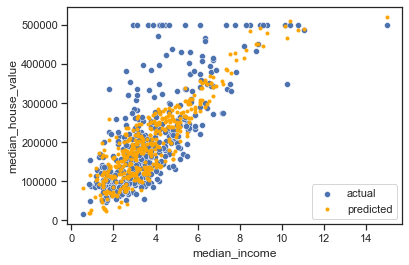

In [117]:
X_plot = X_plot.assign(pred_test2=lambda X_test: spline_pipe.predict(X_test))
# plot
sns.scatterplot(x=X_plot['median_income'], y=y_plot, label='actual')

plt.plot(X_plot['median_income'], X_plot['pred_test2'], label='predicted', color='orange', marker='.', linestyle='')
plt.legend();

Den Analysen entsprechend ist das beste Modell ist die Spline von Scikit Learn mit einem R-squared der Testdaten von 65,25%. <br>
Gemäß dem Data-Science Lifecycle müsste dieses Modell jetzt deployed werden. Dieser Schritt wird allerdings nicht mehr im Rahmen dieses Projekts durchgeführt.